In [1]:
import numpy as np
import pandas as pd
import cv2
import csv
import moviepy
import glob, os
import sys
from scipy.spatial.distance import pdist, squareform
from scipy.stats import ttest_ind, mannwhitneyu
from sklearn.utils import resample
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

## Cropping and initial processing

First, the video needs to be cropped according to the experimental needs. I provide an easy way to identify areas of interest that can be adapted by the user. 

In [8]:
# identify the video you want to process:
videofile = "C:\\Users\\anneserl\\Desktop\\20190416_socialrescue1.avi"
#output = "C:/Users/anneserl/Documents/F121-1016-SocialIsolation/20190201_isolatedvssocial/soc1/social1-1.avi"

In [9]:
cap = cv2.VideoCapture(videofile)

while(True):
    # Capture frame-by-frame
    ret, frame = cap.read()

    # Our operations on the frame come here
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Display the resulting frame
    cv2.imshow('frame',gray)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# When everything done, release the capture
cap.release()
cv2.destroyAllWindows()

In [24]:
# crop videos if need be. 
cap = cv2.VideoCapture(videofile) # set up video capture object for your video file
cap.set(cv2.CAP_PROP_POS_FRAMES,1); # set index to first frame

ret, frame = cap.read() # read in first frame

cv2.namedWindow('firstframe', cv2.WINDOW_NORMAL) # fit to screen
cv2.imshow('firstframe',frame) # show first frame of video

# select coordinates for your points
# video 1:
#y1 = 550
#y2 = 1020
#x1 = 80
#x2 = 540

# video 2:
#y1 = 110
#y2 = 560
#x1 = 80
#x2 = 540

# video 3:
#y1 = 540
#y2 = 1010
#x1 = 560
#x2 = 1020

# video 4:
#y1 = 90
#y2 = 560
#x1 = 550
#x2 = 1020

# video 5:
#y1 = 120
#y2 = 850
#x1 = 950
#x2 = 1700

# video 6:
y1 = 90
y2 = 850
x1 = 190
x2 = 950

#x = [80, 540, 80, 540, 560, 1020, 550, 1020, 1020, 1480, 1020, 1480]
#y = [550, 1020, 10, 560, 540, 1010, 90, 560, 100, 560, 550, 1010]
x = [950, 1700, 190, 950]
y = [120, 850, 90, 850]

roi = frame[y1:y2, x1:x2]
cv2.imshow('cropped', roi)

cv2.waitKey(0)
cv2.destroyAllWindows()
cap.release()

In [25]:
output1 = "C:\\Users\\anneserl\\Desktop\\20190416_socialrescue1-1.avi"
output2 = "C:\\Users\\anneserl\\Desktop\\20190416_socialrescue1-2.avi"
#output3 = "F:/20190402_6cmDish_freeExploration/social6-3.avi"
#output4 = "F:/20190402_6cmDish_freeExploration/social6-4.avi"
#output5 = "F:/20190402_6cmDish_freeExploration/social6-5.avi"
#output6 = "F:/20190402_6cmDish_freeExploration/social6-6.avi"

In [26]:
# as soon as you have suitable coordinates, go on to crop the video and save it
cap = cv2.VideoCapture(videofile)
fourcc = cv2.VideoWriter_fourcc(*'DIVX') # really important, not all codecs are applicable on all systems

size = (int(x[1]-x[0]), int(y[1]-y[0]))
video1 = cv2.VideoWriter(output1, fourcc, 14, size, 0)
size = (int(x[3]-x[2]), int(y[3]-y[2]))
video2 = cv2.VideoWriter(output2, fourcc, 14, size, 0)
#size = (int(x[5]-x[4]), int(y[5]-y[4]))
#video3 = cv2.VideoWriter(output3, fourcc, 14, size, 0)
#size = (int(x[7]-x[6]), int(y[7]-y[6]))
#video4 = cv2.VideoWriter(output4, fourcc, 14, size, 0)
#size = (int(x[9]-x[8]), int(y[9]-y[8]))
#video5 = cv2.VideoWriter(output5, fourcc, 14, size, 0)
#size = (int(x[11]-x[10]), int(y[11]-y[10]))
#video6 = cv2.VideoWriter(output6, fourcc, 14, size, 0)

#fourcc = cv2.VideoWriter_fourcc(*'X264') # <-- X264 does not work on windows
#video = cv2.VideoWriter(output, fourcc, 14, size, 0)

while(1):
    ret, frame = cap.read()
    if ret == True:
        roi = frame[y[0]:y[1], x[0]:x[1]]
        roi = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY) # <-- really important, codec requires particular input
        video1.write(roi)
        
        roi = frame[y[2]:y[3], x[2]:x[3]]
        roi = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY) # <-- really important, codec requires particular input
        video2.write(roi)
        
        #roi = frame[y[4]:y[5], x[4]:x[5]]
        #roi = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY) # <-- really important, codec requires particular input
        #video3.write(roi)
        
        #roi = frame[y[6]:y[7], x[6]:x[7]]
        #roi = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY) # <-- really important, codec requires particular input
        #video4.write(roi)
        
        #roi = frame[y[8]:y[9], x[8]:x[9]]
        #roi = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY) # <-- really important, codec requires particular input
        #video5.write(roi)
        
        #roi = frame[y[10]:y[11], x[10]:x[11]]
        #roi = cv2.cvtColor(roi, cv2.COLOR_BGR2GRAY) # <-- really important, codec requires particular input
        #video6.write(roi)
        
        #cv2.imshow('frame',roi)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
    else:
        break

video1.release()   
video2.release()  
#video3.release()  
#video4.release()  
#video5.release()  
#video6.release()  
cv2.destroyAllWindows()
cap.release()

# Background subtraction

After the partitioned videos have been saved to different subfolders, a list of these subfolders is created. The next aim is to loop through the videos in the different folders and perform a background subtraction + blob detection. 

In [2]:
# First, we create a list of all the folders we created in our directory.
# Next we loop through all the files and inspect the videos.
        
folderlist = [x[0] for x in os.walk("E:/20190408/tobedone/")]
folderlist = folderlist[1::]

for folder in folderlist:
    for file in os.listdir(folder):
        print(os.path.join("E:/20190408/tobedone/", file))

E:/20190408/tobedone/soc2_helldunkel-1.avi
E:/20190408/tobedone/soc2_helldunkel-2.avi
E:/20190408/tobedone/soc2_helldunkel-3.avi
E:/20190408/tobedone/soc2_helldunkel-4.avi
E:/20190408/tobedone/soc2_helldunkel-5.avi
E:/20190408/tobedone/soc2_helldunkel-6.avi
E:/20190408/tobedone/soc7-1.avi
E:/20190408/tobedone/soc7-2.avi
E:/20190408/tobedone/soc7-3.avi
E:/20190408/tobedone/soc7-4.avi
E:/20190408/tobedone/soc7-5.avi
E:/20190408/tobedone/soc7-6.avi
E:/20190408/tobedone/soc8-1.avi
E:/20190408/tobedone/soc8-2.avi
E:/20190408/tobedone/soc8-3.avi
E:/20190408/tobedone/soc8-4.avi
E:/20190408/tobedone/soc8-5.avi
E:/20190408/tobedone/soc8-6.avi


After inspecting the files and verifying that we found everything we want to process in the next steps, we now perform a background-subtraction for every video and combine this with a blob detector.

In [3]:
for folder in folderlist:
    newfolder = folder + '/' + 'BGS'
    os.mkdir(newfolder)
    for file in os.listdir(folder):
        if file.endswith('.avi'):
            filestring = folder + '/' + file 
            videopath = os.path.join("E:/20190408/tobedone/", filestring)
            cap = cv2.VideoCapture(videopath) # argument can be either device index or name of video file
            
            size = (int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)))
            fourcc = cv2.VideoWriter_fourcc(*'DIVX')
            outputpath = newfolder + '/' + os.path.splitext(file)[0] + '_blob.avi'            
            video = cv2.VideoWriter(outputpath, fourcc, 14, size, isColor=False)
            
            # Set up the blob detector with default parameters.
            #detector = cv2.SimpleBlobDetector()

            fgbg = cv2.bgsegm.createBackgroundSubtractorMOG()
            while(1):
                ret, frame = cap.read()
                if ret == True:
                    fgmask = fgbg.apply(frame)
                    video.write(fgmask)
                    #cv2.imshow('frame',fgmask)
                else:
                    cap.release()
                    video.release()
                    break

                k = cv2.waitKey(30) & 0xff
                if k == 27:
                    break

            cv2.destroyAllWindows()
            cap.release()

# Blob detection

After background-subtraction, it is rather straight-forward to identify animals within the video.

In [4]:
folderlist = [x[0] for x in os.walk("E:/20190408/")]
folderlist = folderlist[1::]
BGSfolder = []

for folder in folderlist:
    if folder.endswith("BGS"):
        folder = folder.replace('\\', '/')
        BGSfolder.append(folder)

for folder in BGSfolder:
    newfolder = folder + '/' + 'BLOBS'
    os.mkdir(newfolder)
    for file in os.listdir(folder):
        if file.endswith('.avi'):
            filestring = folder + '/' + file 
            videopath = filestring
            cap = cv2.VideoCapture(videopath) # argument can be either device index or name of video file
            size = (int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT)))
            fourcc = cv2.VideoWriter_fourcc(*'DIVX')
            
            outputpath = newfolder + '/' + os.path.splitext(file)[0] + '_tracked.avi'  
            print('processing: ' + videopath)
            print('saving to: ' + outputpath)

            video = cv2.VideoWriter(outputpath, fourcc, 14, size, isColor=True)

            locations = []
            xloc = []
            yloc = []
            frameID = []
            i = 0
            analysis = newfolder + '/' + os.path.splitext(file)[0] + '_analysis.csv'
            myfile = open(analysis, 'w', encoding='utf8', newline='')
            wr = csv.writer(myfile)
            
            while(1):
                ret, frame = cap.read()
                if not ret:
                    cap.release()
                    video.release()
                    cv2.destroyAllWindows()
                    myfile.close()
                    break
                i += 1
                # frame = cv2.convertScaleAbs(frame)
                params = cv2.SimpleBlobDetector_Params()
                params.blobColor = 0 # 0 for dark blobs and 255 for light blobs - according to some pages, this code is broken.
                params.filterByColor = False

                # Filter by area
                params.minArea = 5
                params.filterByArea = True

                # Change thresholds
                params.minThreshold = 10
                params.maxThreshold = 200   

                # Filter by Circularity
                params.filterByCircularity = True
                params.minCircularity = 0.1

                # Filter by Convexity
                params.filterByConvexity = True
                params.minConvexity = 0.45

                # Filter by Inertia
                params.filterByInertia = True
                params.minInertiaRatio = 0.01    

                ver = (cv2.__version__).split('.')

                if int(ver[0]) < 3:
                    detector = cv2.SimpleBlobDetector(params)
                else:
                    detector = cv2.SimpleBlobDetector_create(params)
                keypoints = detector.detect(frame)

                # extract xy-coordinates from keypoints (=blobs) and save them in a file.

                for keypoint in keypoints: # adapt this for only one fish
                    x = keypoint.pt[0]
                    y = keypoint.pt[1]
                    xloc.append(x)
                    yloc.append(y)

                fID = len(keypoints)
                for j in range(fID):
                    frameID.append(i)

                locations.append(len(keypoints))

                mylist = [frameID, xloc, yloc]
                wr.writerow(mylist)
                frameID = []
                xloc = []
                yloc = []

                im_with_keypoints = cv2.drawKeypoints(frame, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
                if ret == True:
                    video.write(im_with_keypoints)
                    #cv2.imshow('frame', im_with_keypoints)
                else:
                    cap.release()
                    break
                k = cv2.waitKey(10) & 0xff
                if k == 27:
                    break  
            # When everything is done, release the capture
            cap.release()
            cv2.destroyAllWindows()
            video.release()
            myfile.close()

processing: E:/20190408/iso1_helldunkel/BGS/iso1_helldunkel-1_blob.avi
saving to: E:/20190408/iso1_helldunkel/BGS/BLOBS/iso1_helldunkel-1_blob_tracked.avi
processing: E:/20190408/iso1_helldunkel/BGS/iso1_helldunkel-2_blob.avi
saving to: E:/20190408/iso1_helldunkel/BGS/BLOBS/iso1_helldunkel-2_blob_tracked.avi
processing: E:/20190408/iso1_helldunkel/BGS/iso1_helldunkel-3_blob.avi
saving to: E:/20190408/iso1_helldunkel/BGS/BLOBS/iso1_helldunkel-3_blob_tracked.avi
processing: E:/20190408/iso1_helldunkel/BGS/iso1_helldunkel-4_blob.avi
saving to: E:/20190408/iso1_helldunkel/BGS/BLOBS/iso1_helldunkel-4_blob_tracked.avi
processing: E:/20190408/iso1_helldunkel/BGS/iso1_helldunkel-5_blob.avi
saving to: E:/20190408/iso1_helldunkel/BGS/BLOBS/iso1_helldunkel-5_blob_tracked.avi
processing: E:/20190408/iso2_helldunkel/BGS/iso2_helldunkel-1_blob.avi
saving to: E:/20190408/iso2_helldunkel/BGS/BLOBS/iso2_helldunkel-1_blob_tracked.avi
processing: E:/20190408/iso2_helldunkel/BGS/iso2_helldunkel-2_blob.avi

# Analysis of trajectories
## Free Exploration

So far, the pipeline has performed a background subtraction and identified the fish in all the videos. You can inspect the videos manually to get a feeling for the quality of the tracking. Additionally, you ended up with csv-files that contain for each video the x- and y-coordinates for the tracked fish in every frame. With this information, we can proceed to look into behavioral patterns. 

Enter the path of the directory containing the processed files in subdirectories: E:\20190408
processing: E:\20190408\isolated7\BGS\BLOBS\isolated7-1_blob_analysis.csv


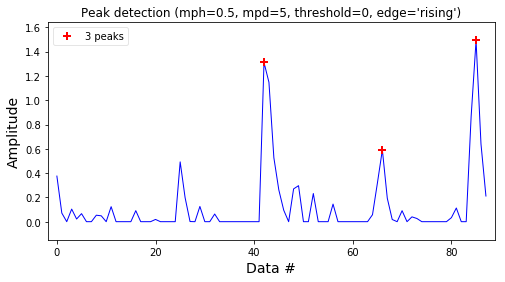

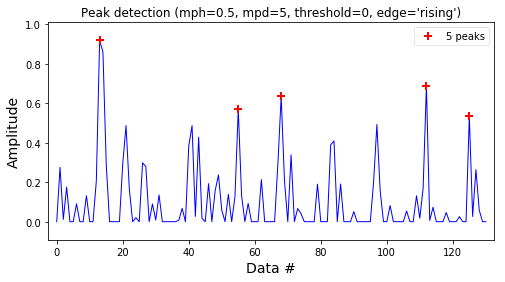

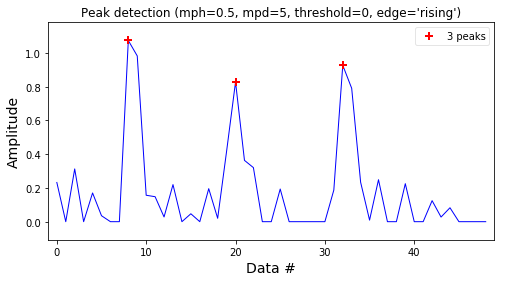

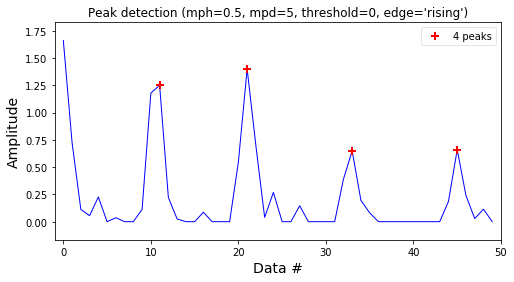

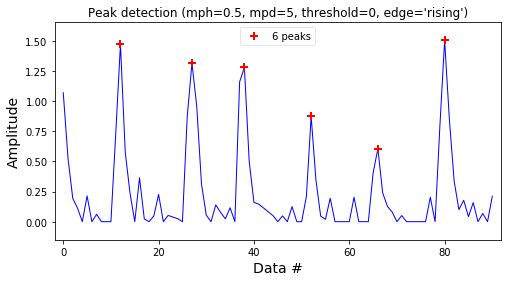

...

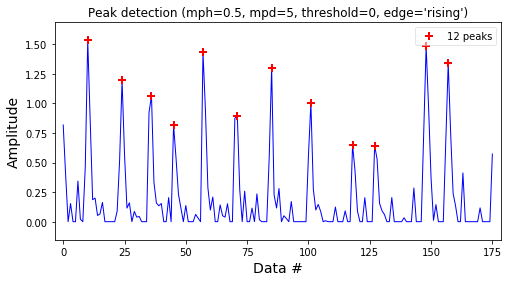

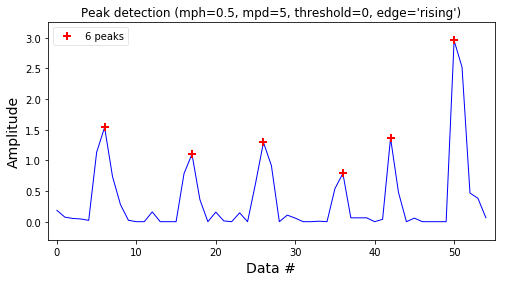

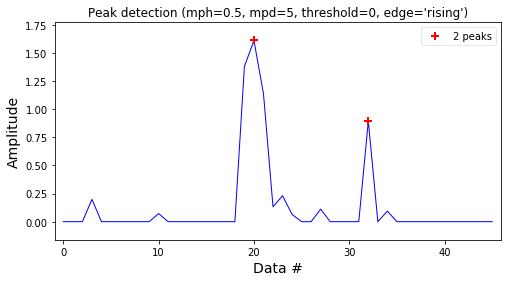

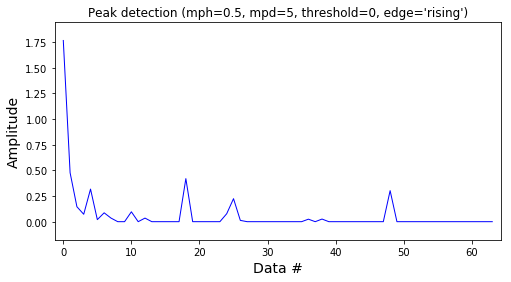

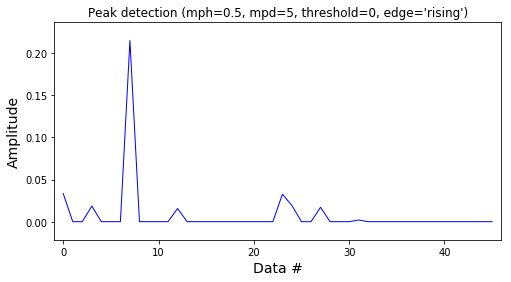

processing: E:\20190408\isolated7\BGS\BLOBS\isolated7-2_blob_analysis.csv


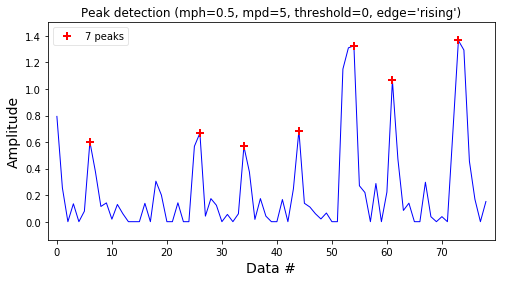

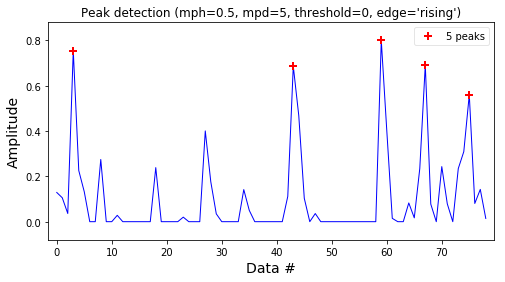

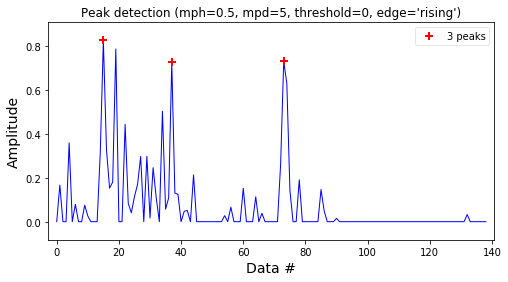

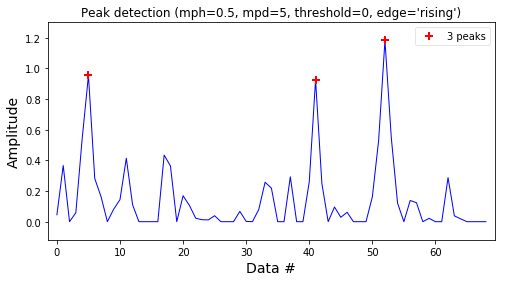

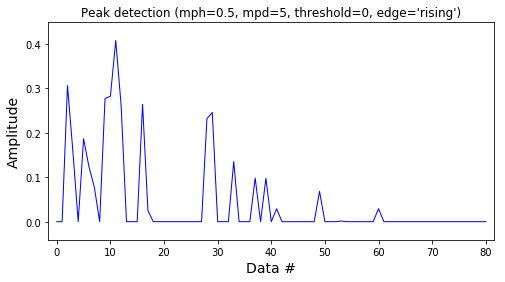

...

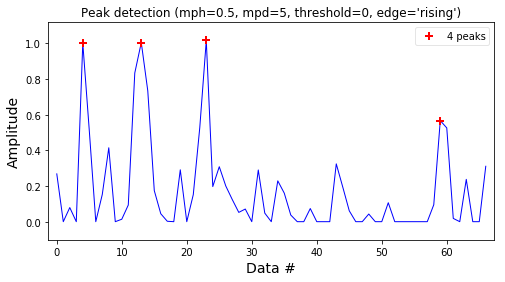

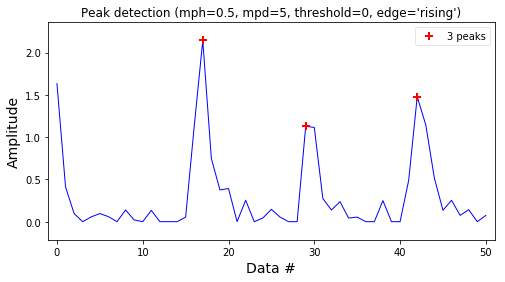

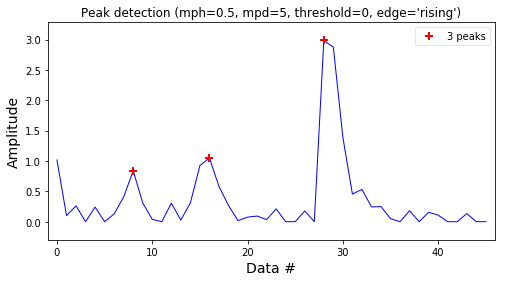

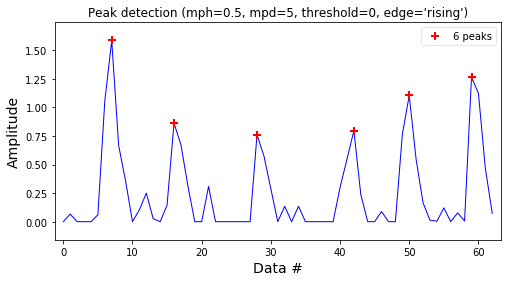

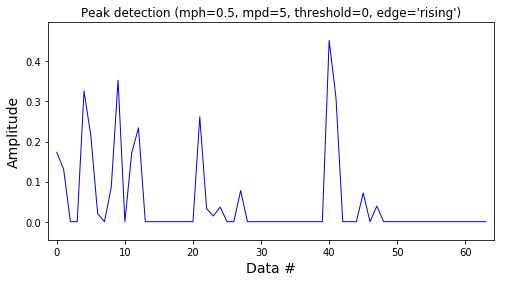

processing: E:\20190408\isolated7\BGS\BLOBS\isolated7-3_blob_analysis.csv


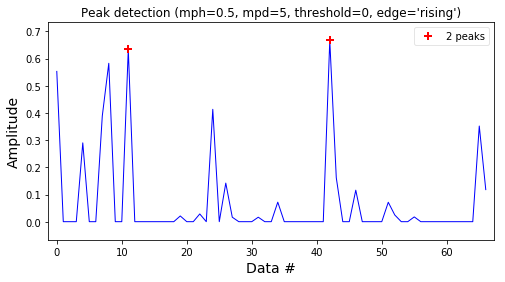

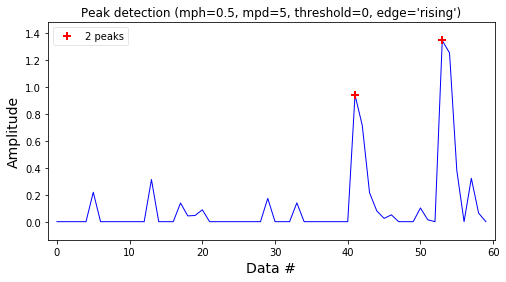

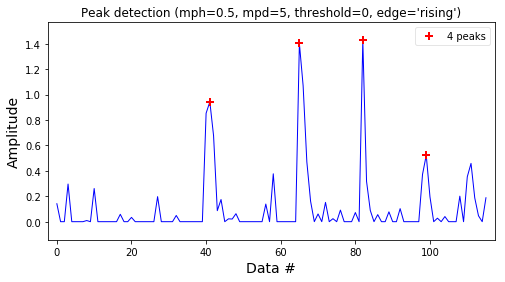

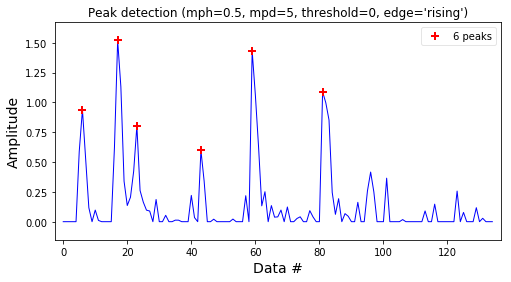

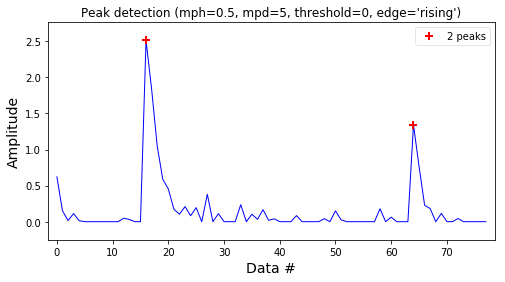

...

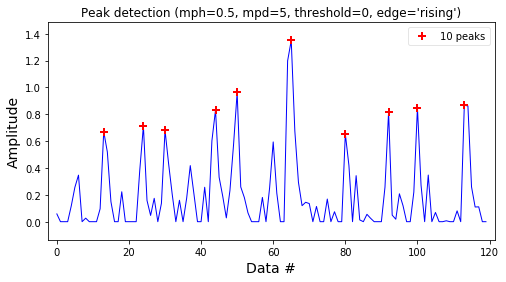

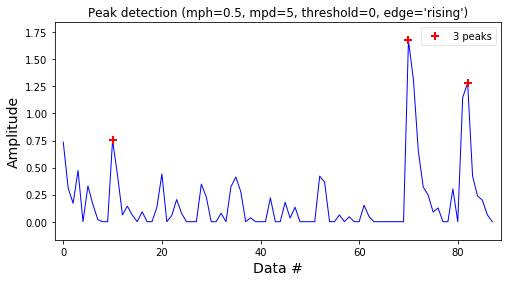

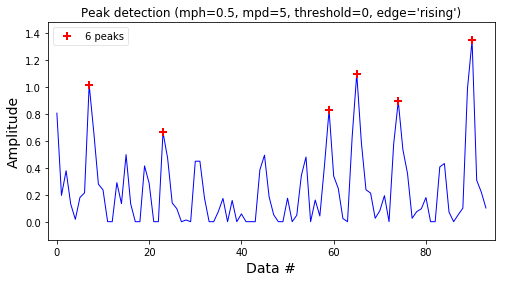

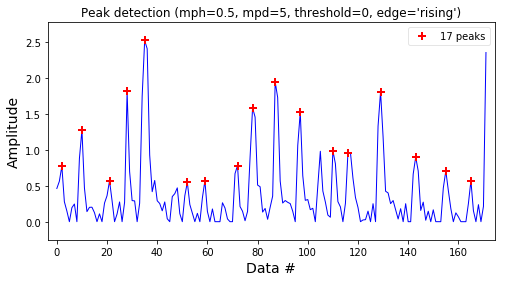

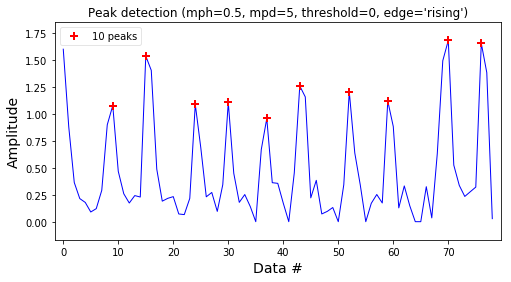

processing: E:\20190408\isolated7\BGS\BLOBS\isolated7-4_blob_analysis.csv


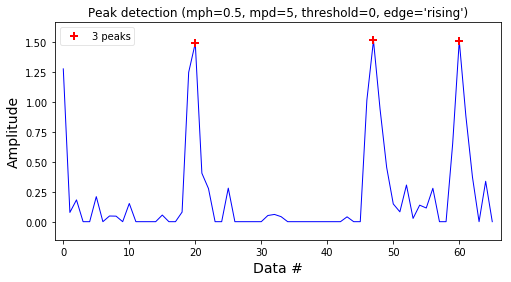

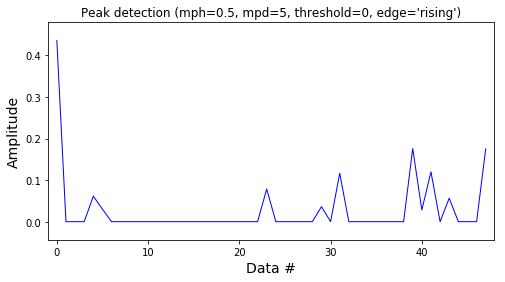

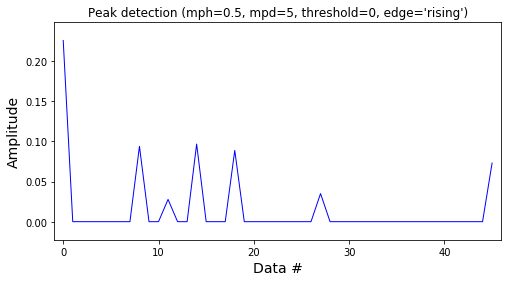

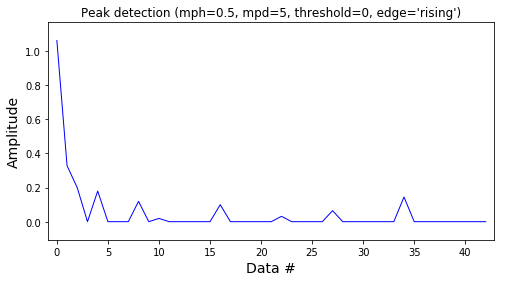

processing: E:\20190408\isolated7\BGS\BLOBS\isolated7-5_blob_analysis.csv
processing: E:\20190408\isolated7\BGS\BLOBS\isolated7-6_blob_analysis.csv


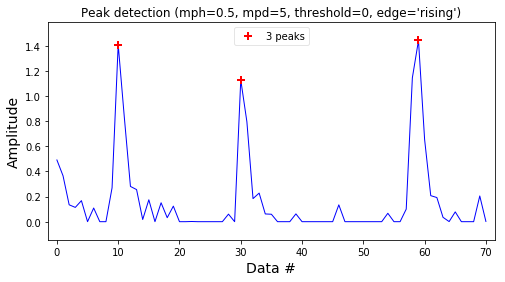

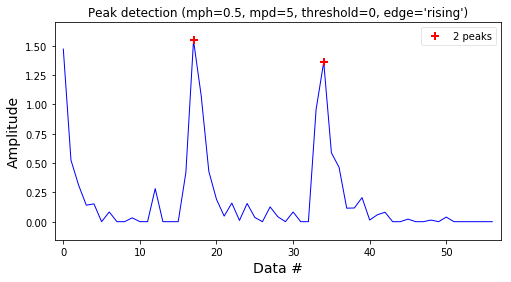

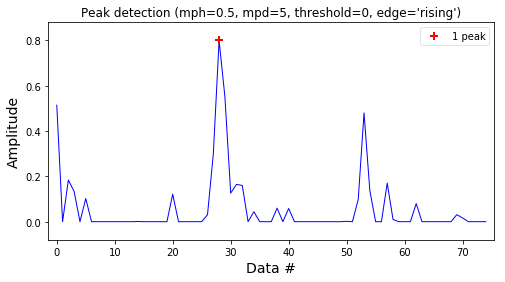

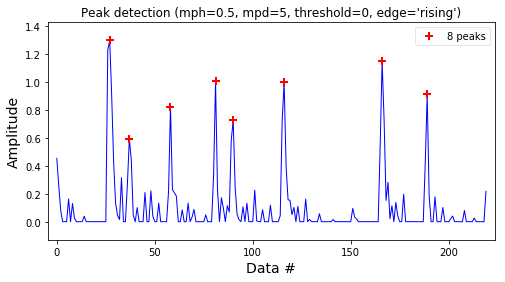

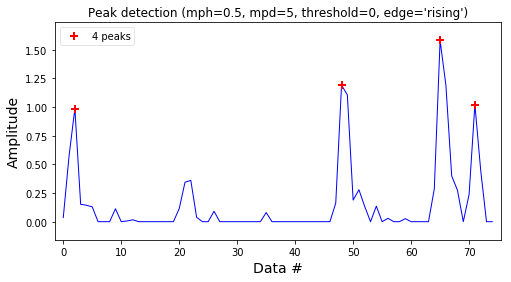

...

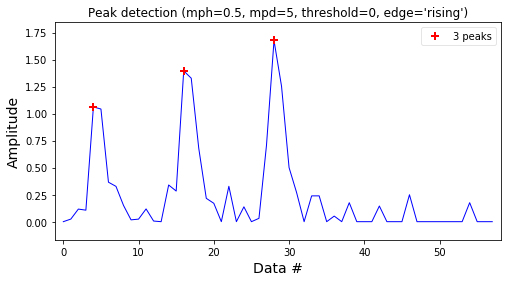

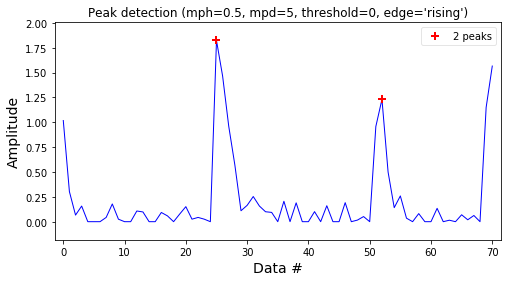

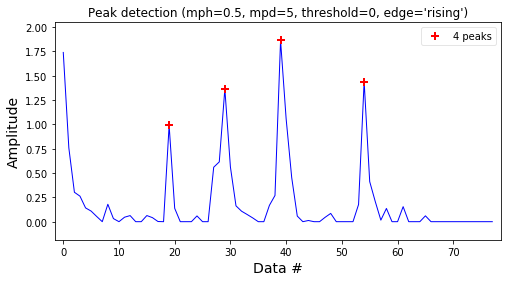

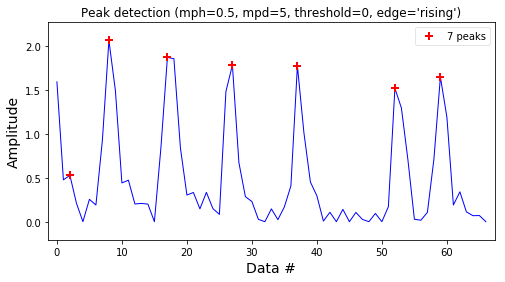

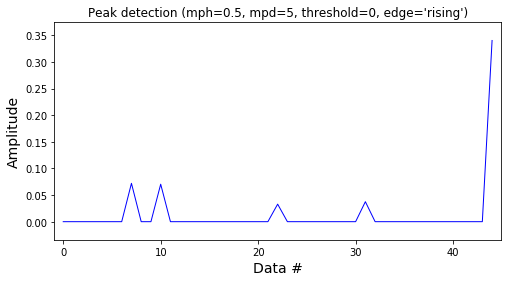

processing: E:\20190408\isolated8\BGS\BLOBS\isolated8-1_blob_analysis.csv


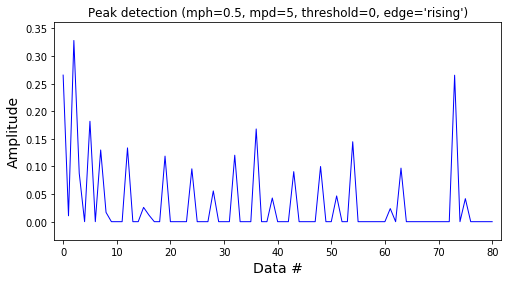

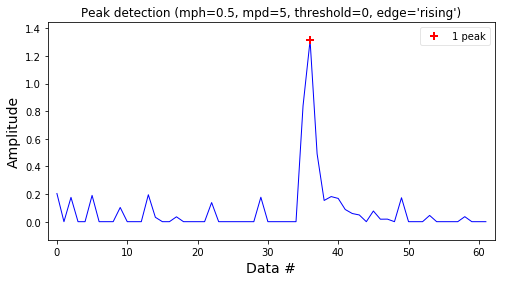

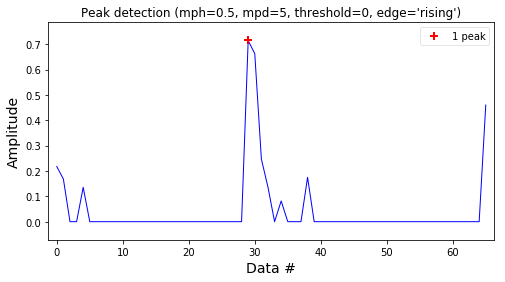

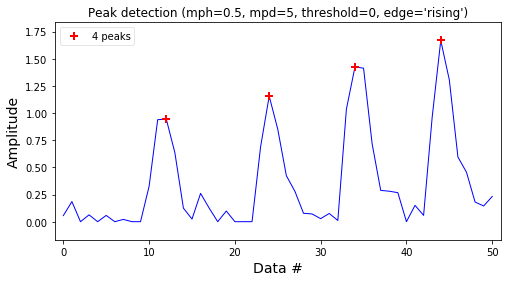

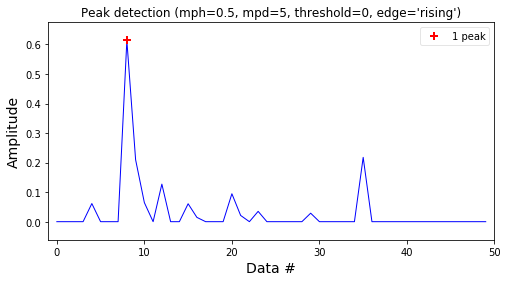

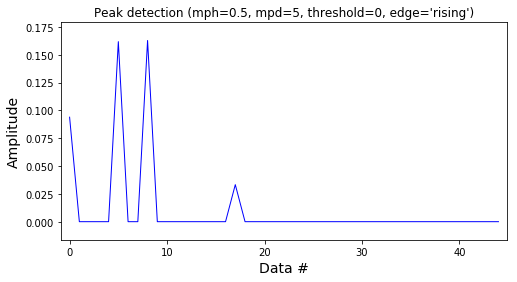

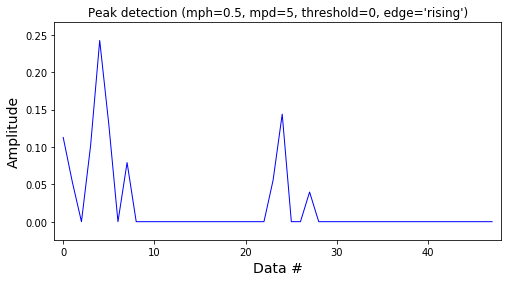

processing: E:\20190408\isolated8\BGS\BLOBS\isolated8-2_blob_analysis.csv


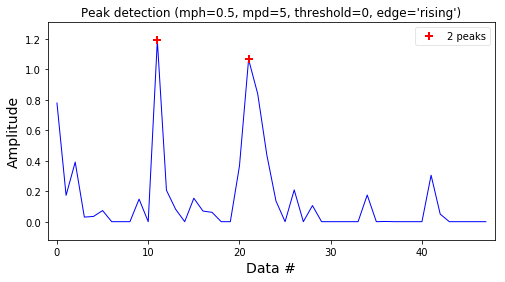

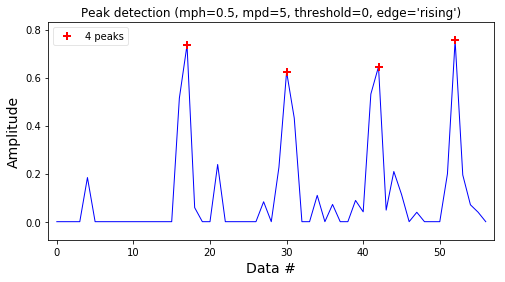

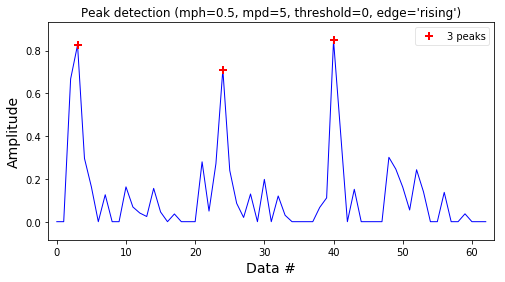

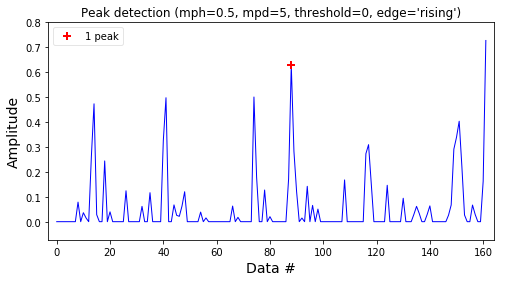

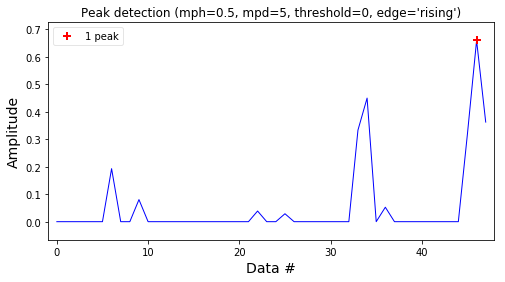

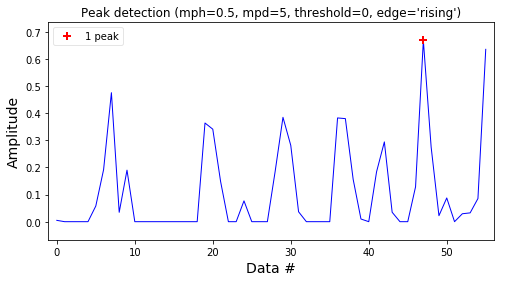

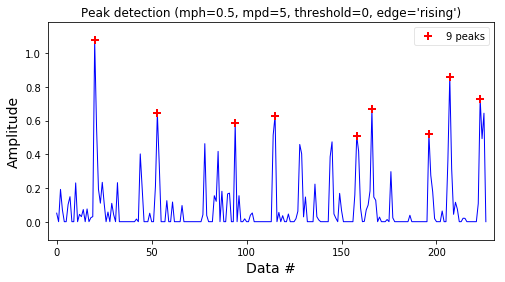

processing: E:\20190408\isolated8\BGS\BLOBS\isolated8-3_blob_analysis.csv


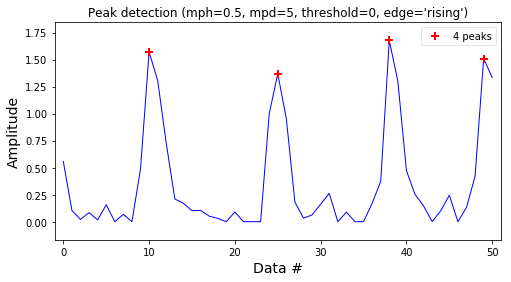

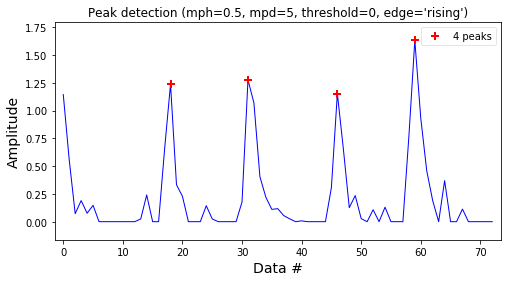

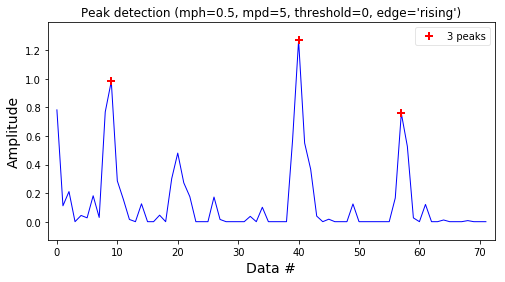

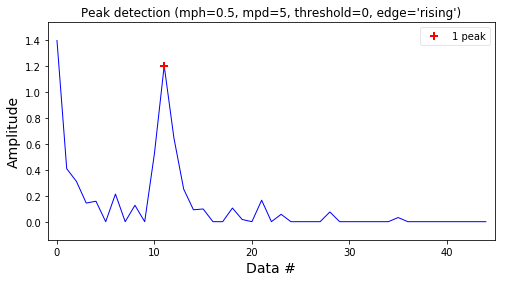

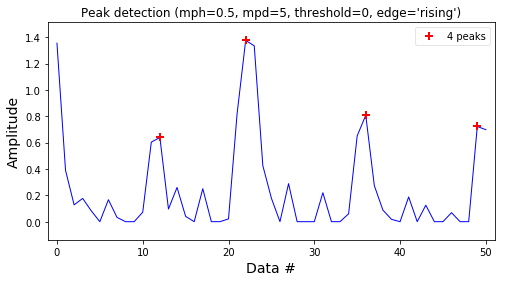

...

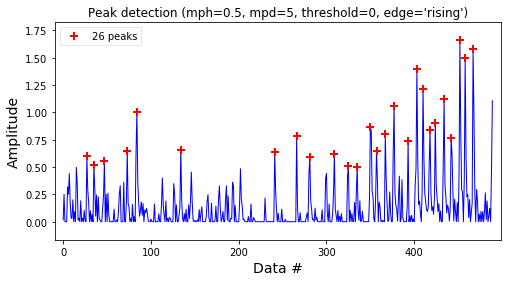

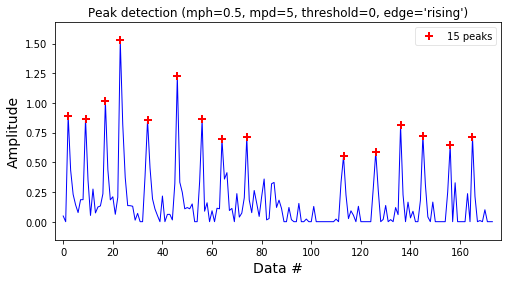

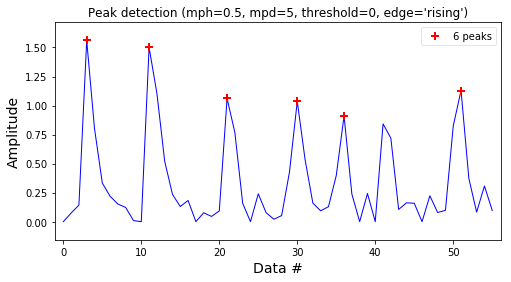

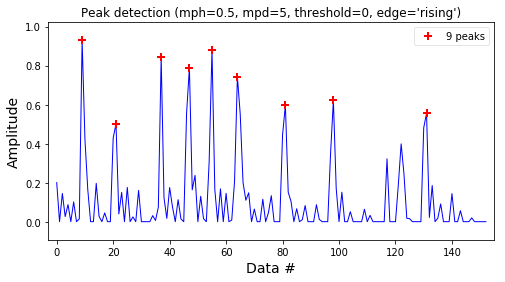

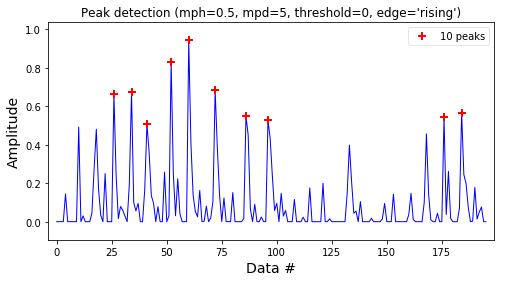

processing: E:\20190408\isolated8\BGS\BLOBS\isolated8-4_blob_analysis.csv


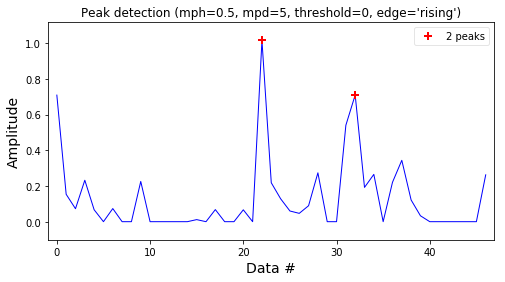

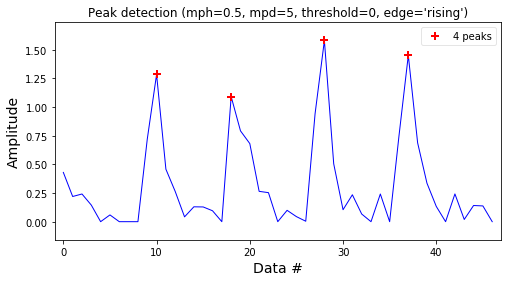

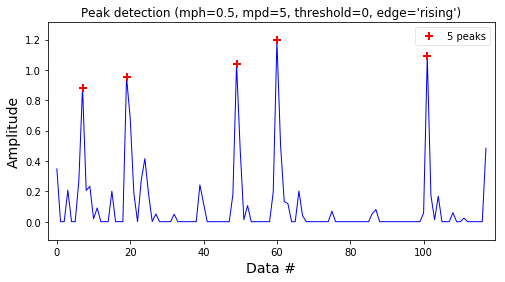

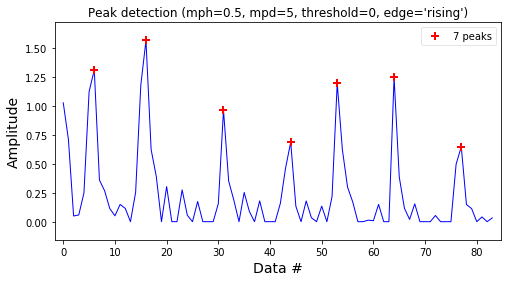

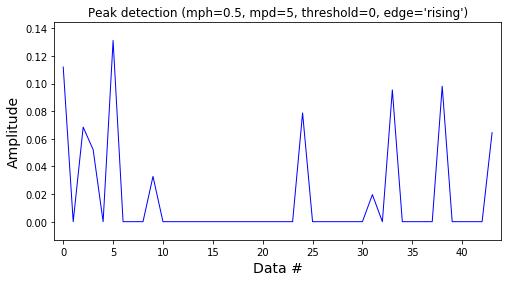

...

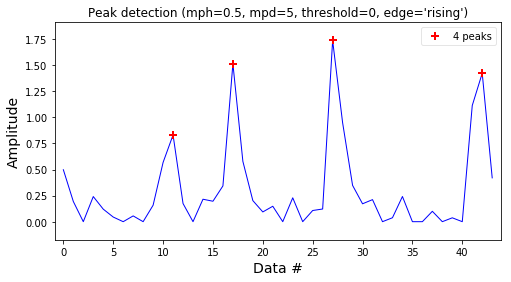

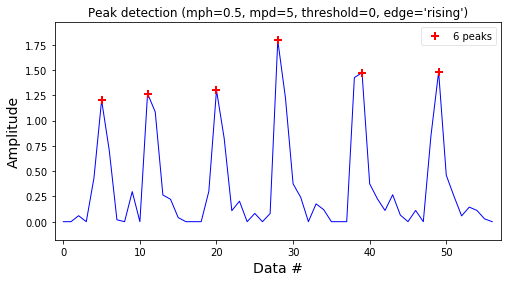

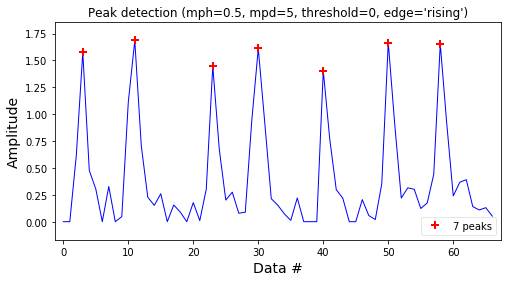

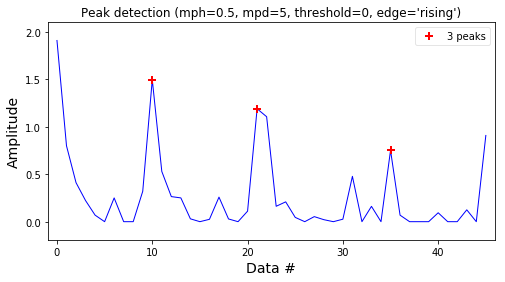

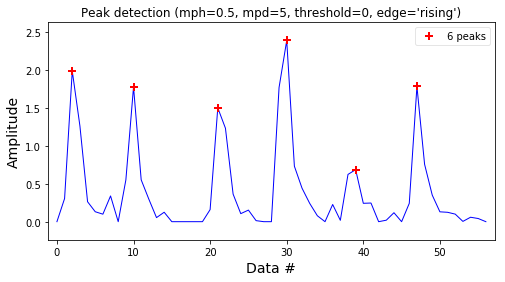

processing: E:\20190408\isolated8\BGS\BLOBS\isolated8-6_blob_analysis.csv


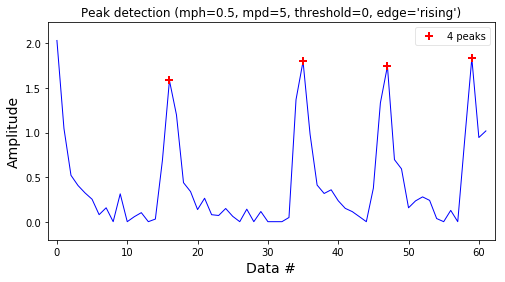

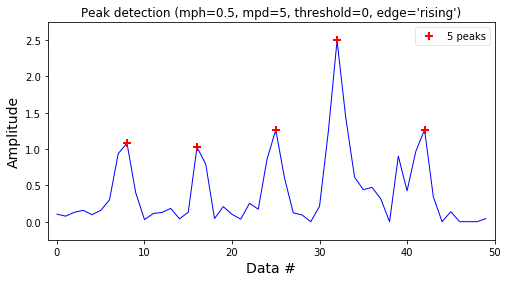

processing: E:\20190408\social7\BGS\BLOBS\social7-1_blob_analysis.csv


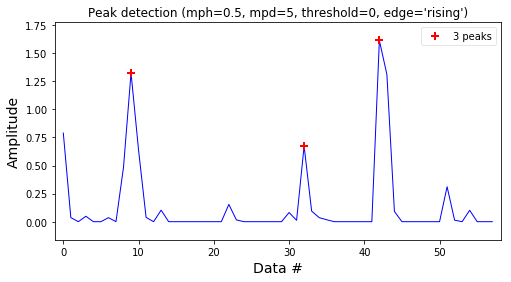

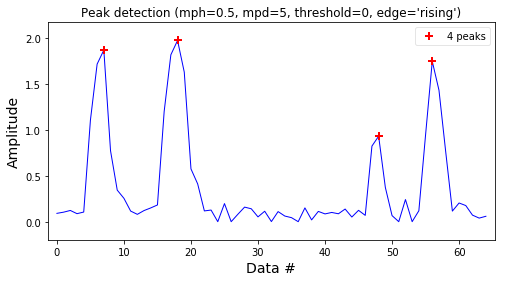

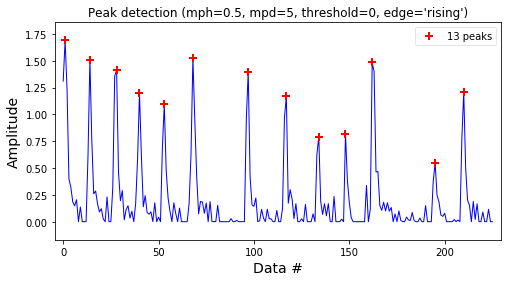

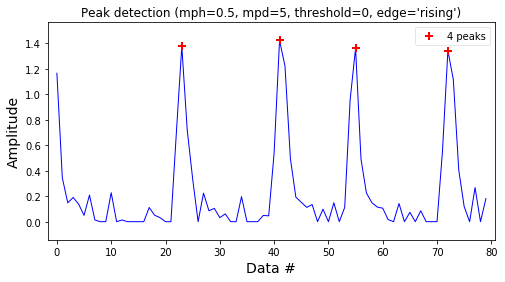

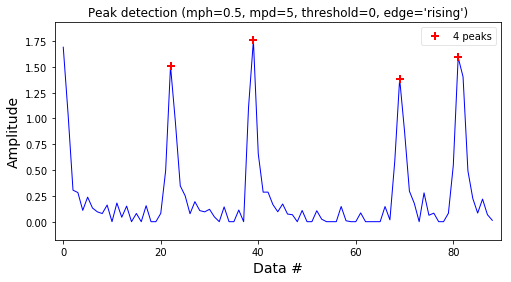

...

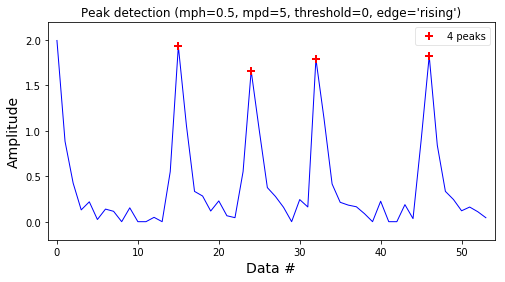

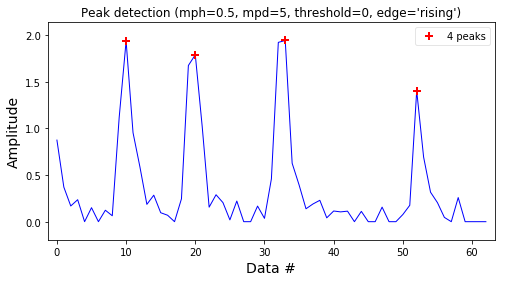

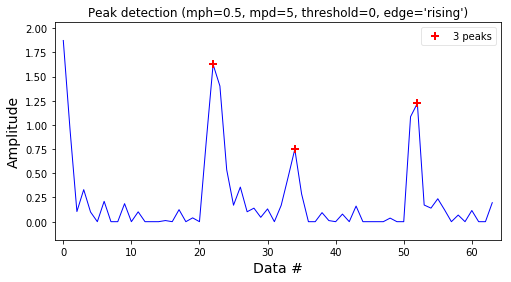

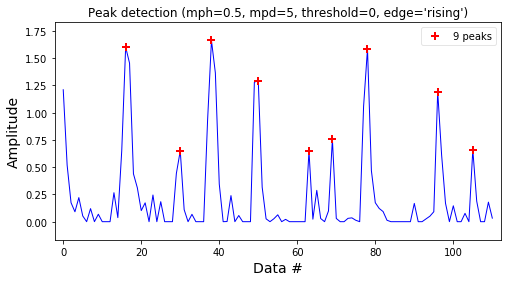

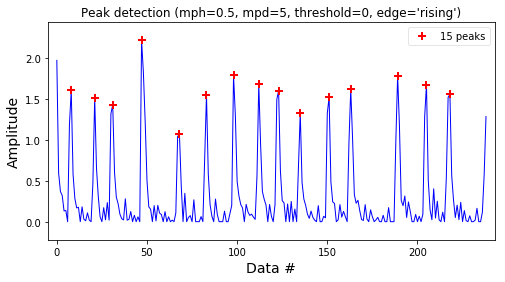

processing: E:\20190408\social7\BGS\BLOBS\social7-2_blob_analysis.csv


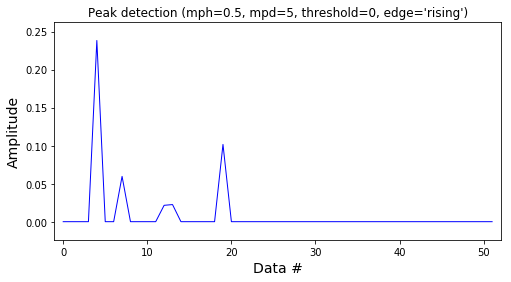

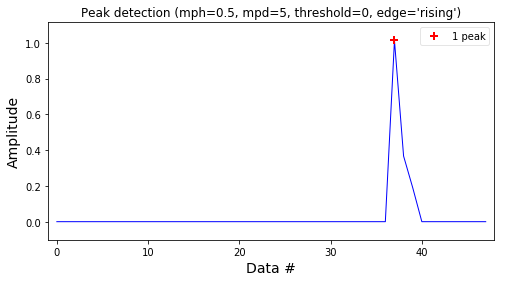

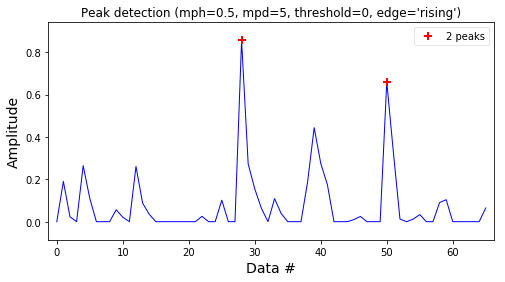

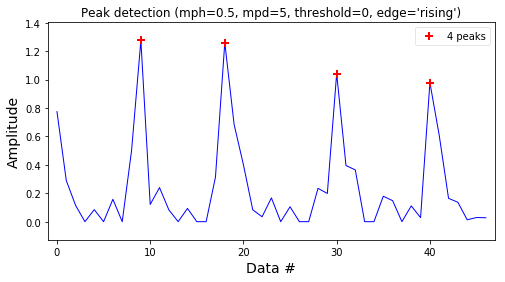

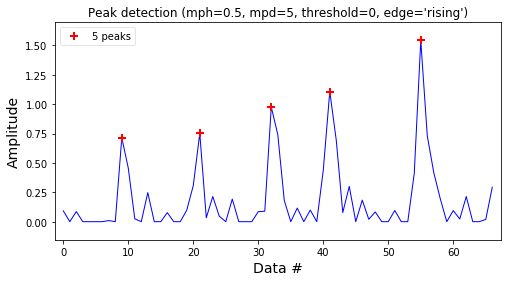

...

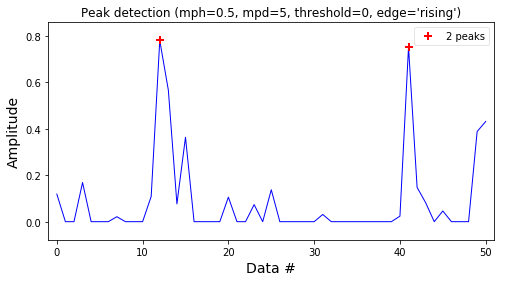

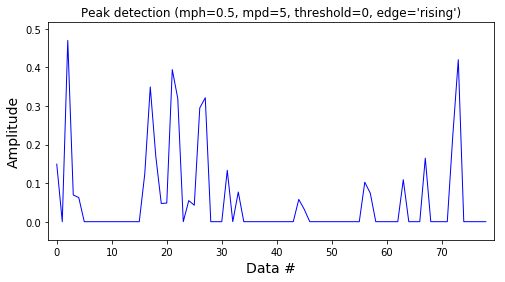

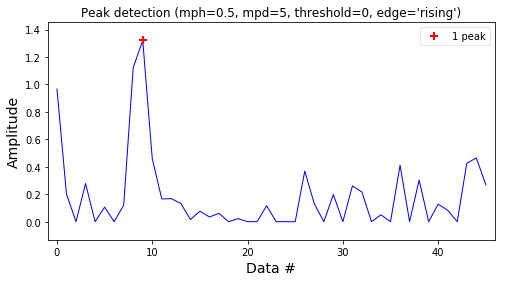

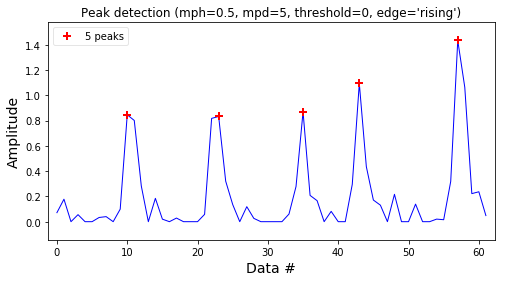

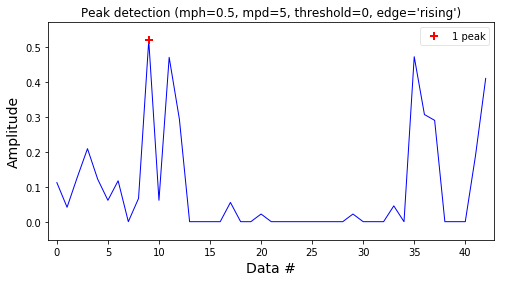

processing: E:\20190408\social7\BGS\BLOBS\social7-3_blob_analysis.csv


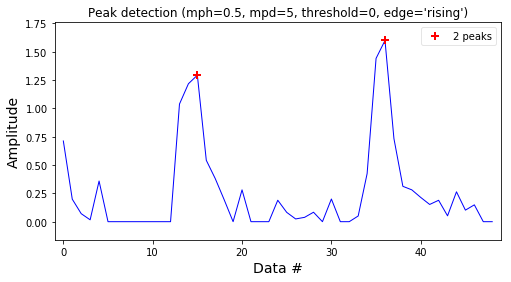

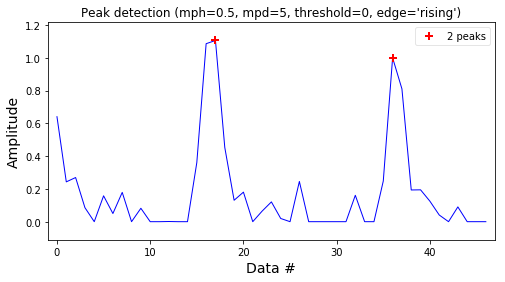

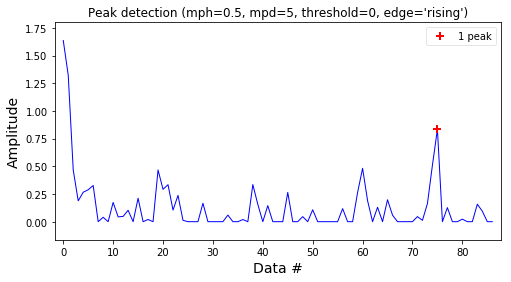

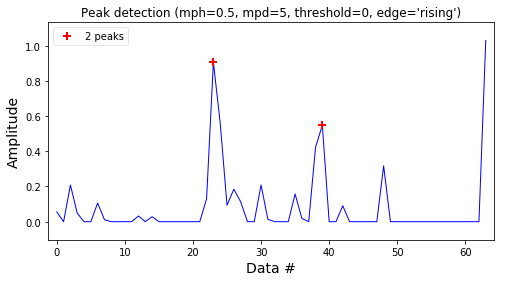

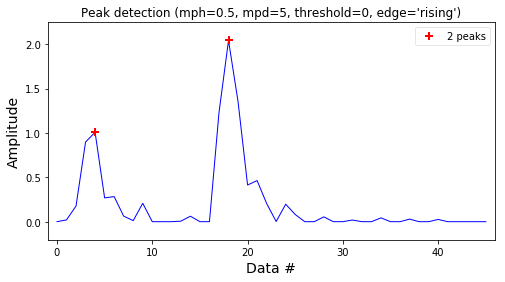

...

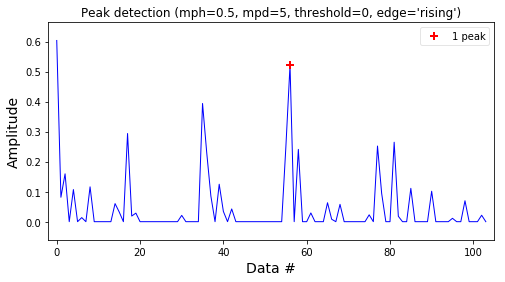

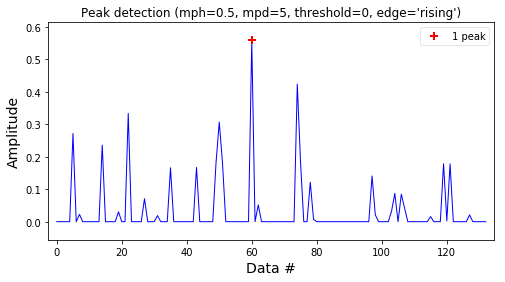

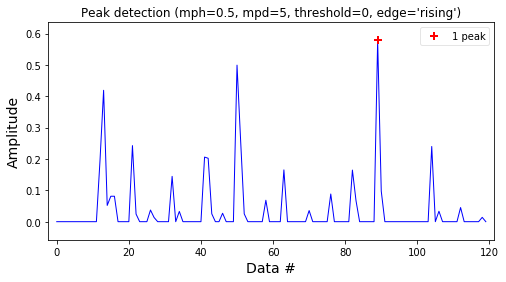

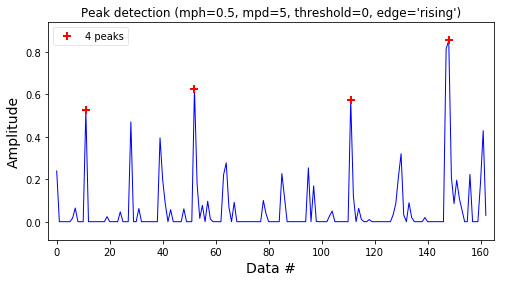

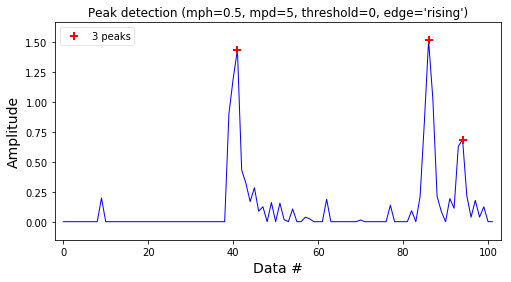

processing: E:\20190408\social7\BGS\BLOBS\social7-4_blob_analysis.csv


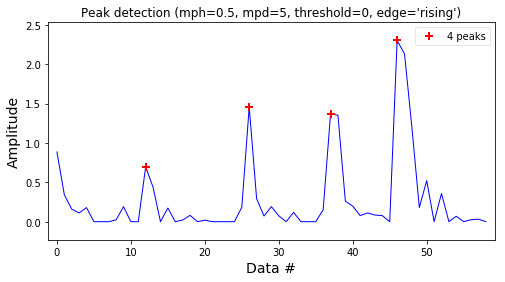

processing: E:\20190408\social7\BGS\BLOBS\social7-5_blob_analysis.csv


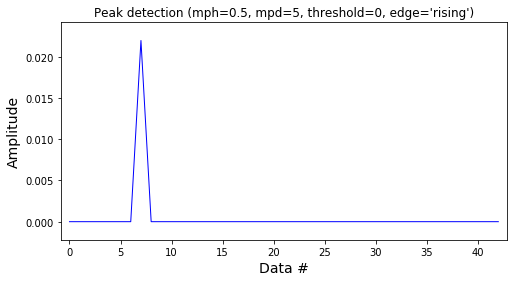

processing: E:\20190408\social7\BGS\BLOBS\social7-6_blob_analysis.csv


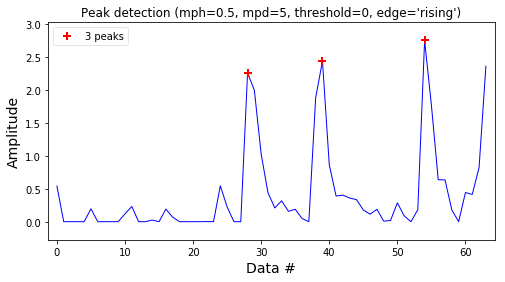

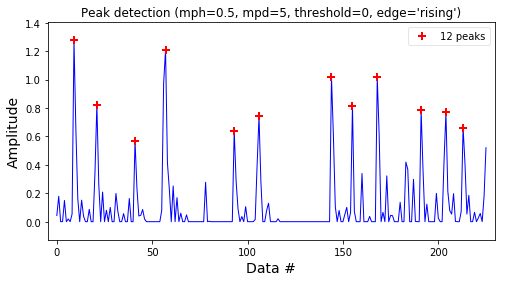

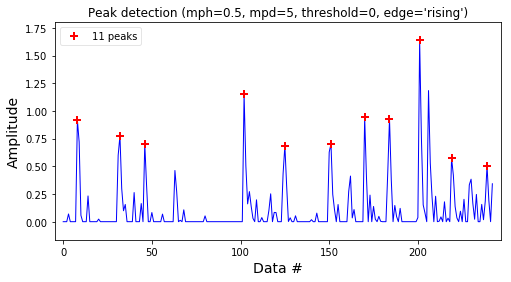

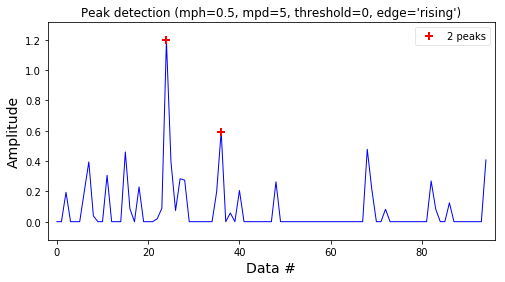

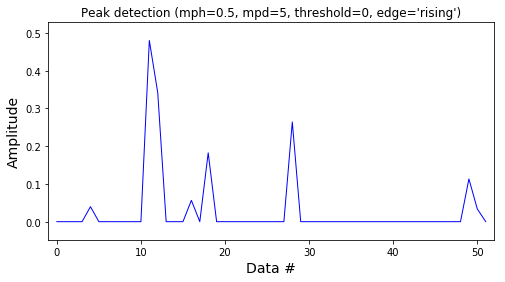

...

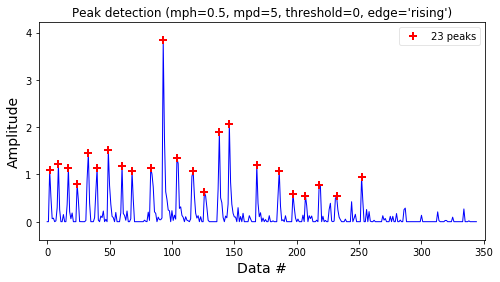

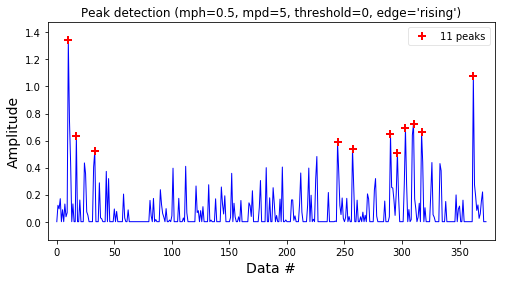

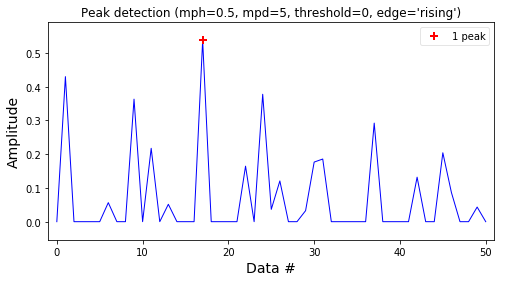

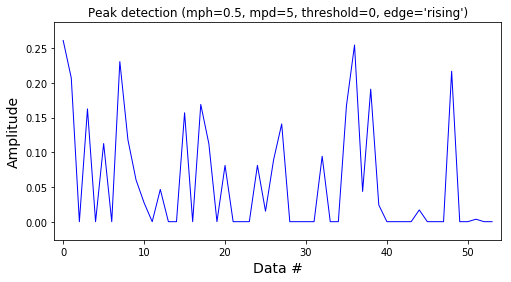

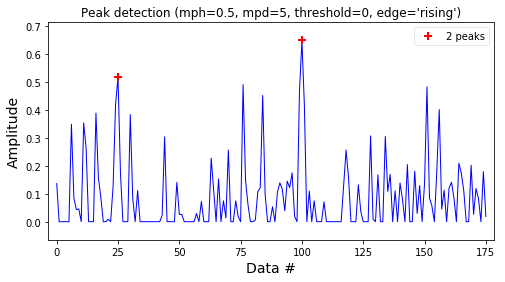

processing: E:\20190408\social8\BGS\BLOBS\social8-1_blob_analysis.csv


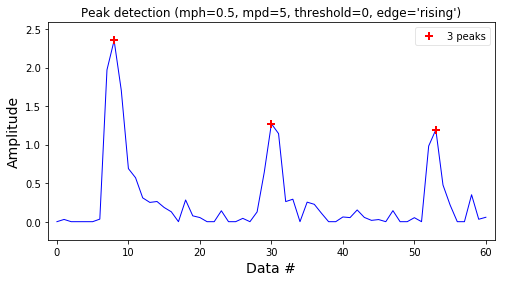

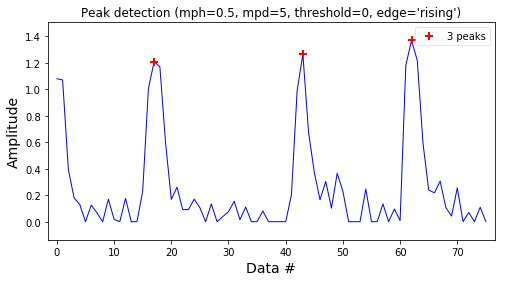

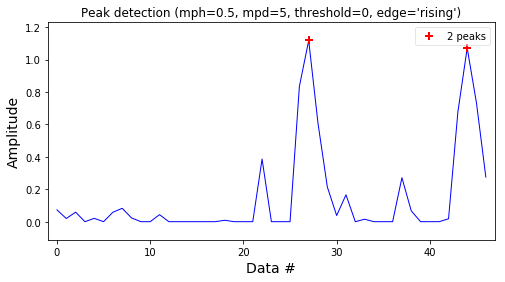

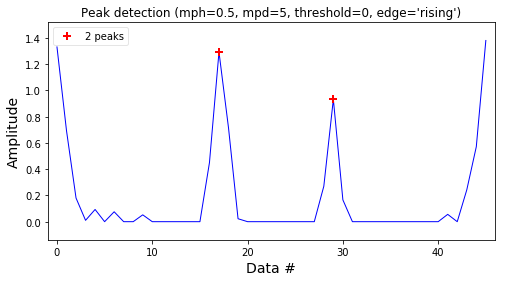

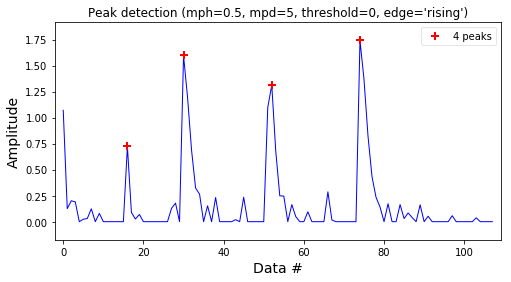

...

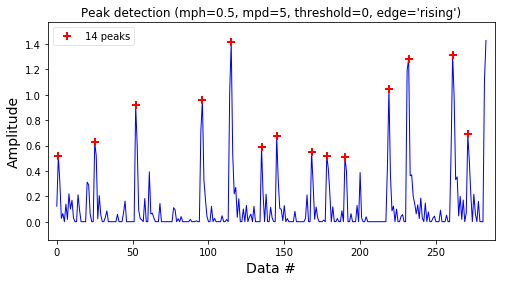

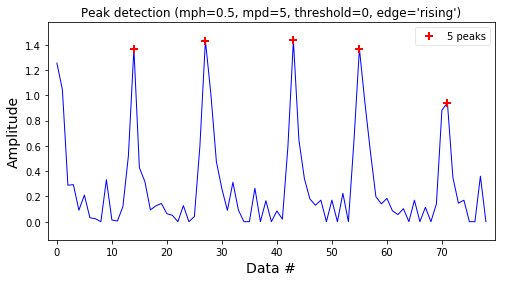

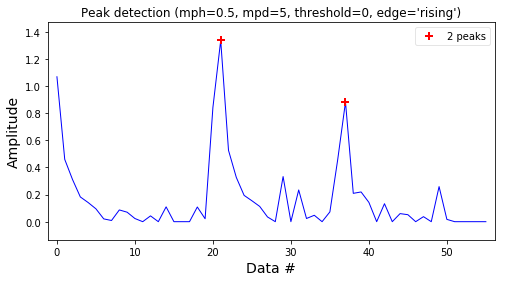

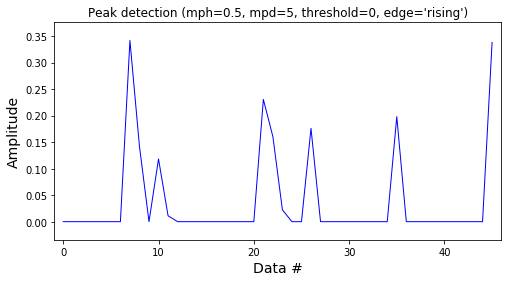

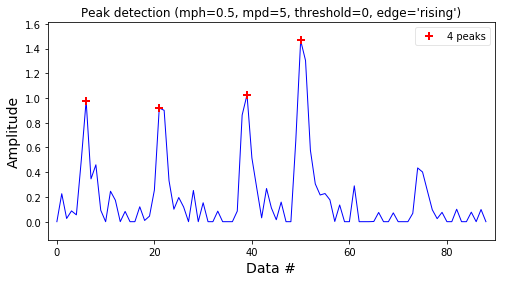

processing: E:\20190408\social8\BGS\BLOBS\social8-2_blob_analysis.csv


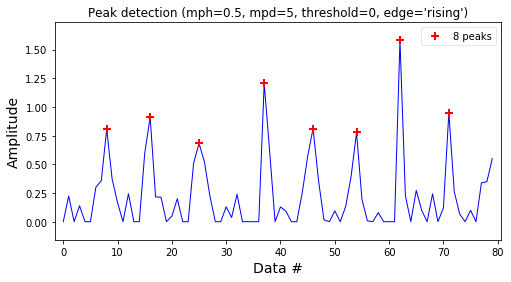

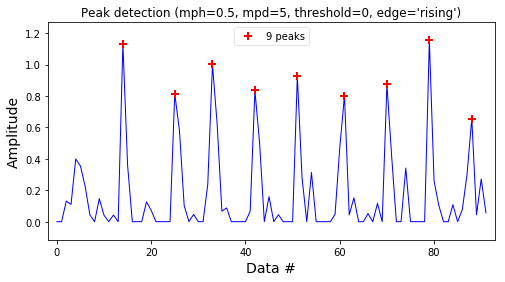

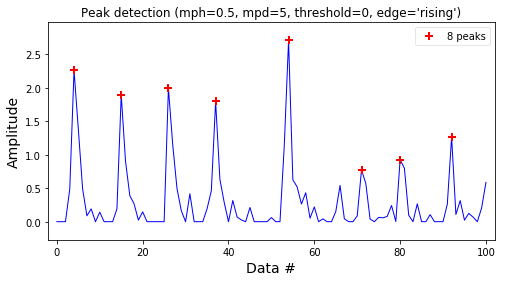

processing: E:\20190408\social8\BGS\BLOBS\social8-3_blob_analysis.csv


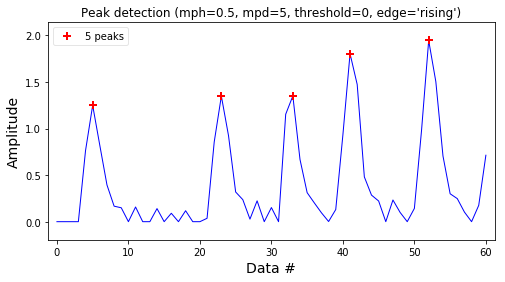

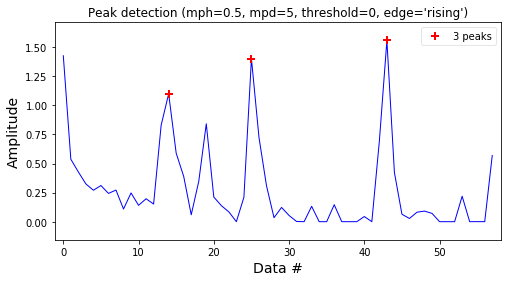

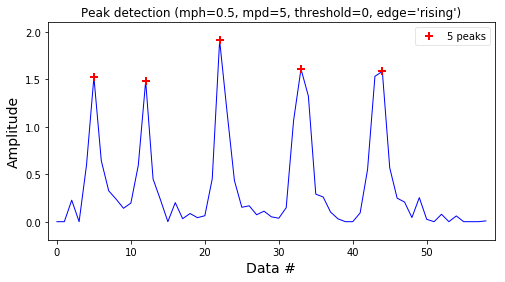

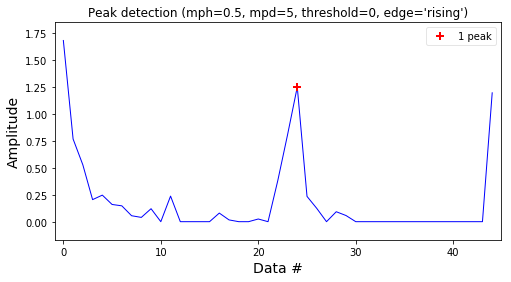

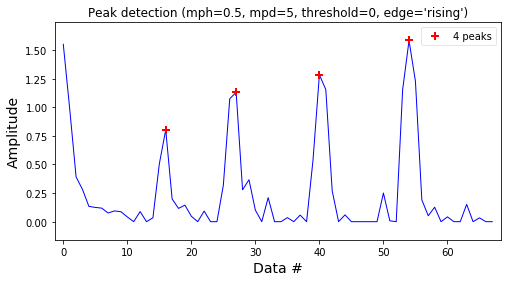

...

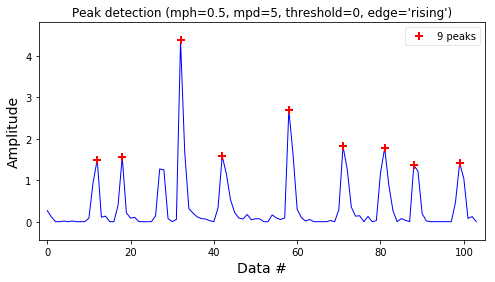

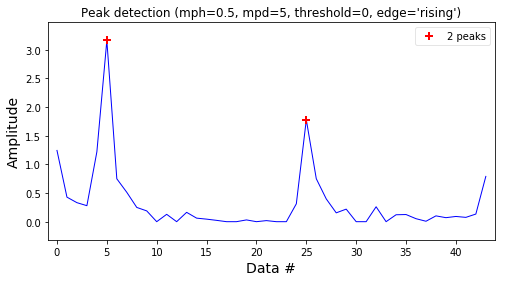

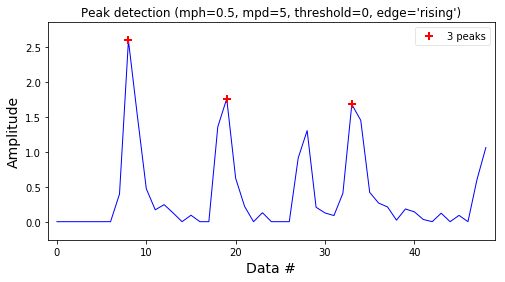

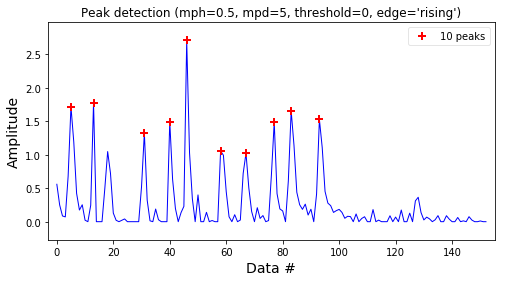

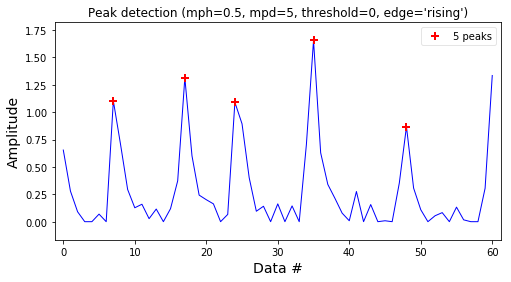

processing: E:\20190408\social8\BGS\BLOBS\social8-4_blob_analysis.csv


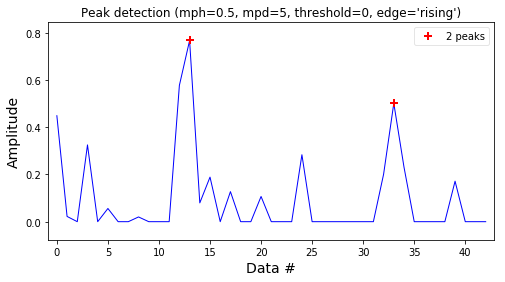

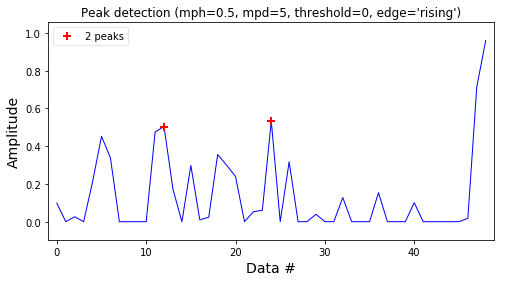

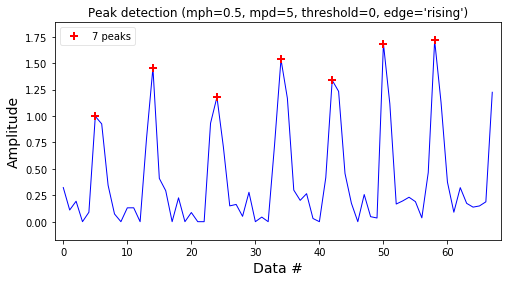

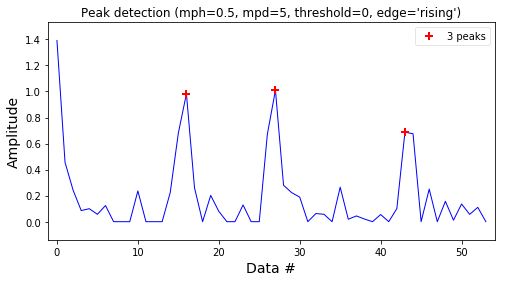

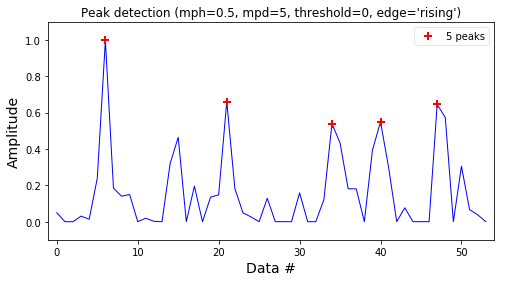

...

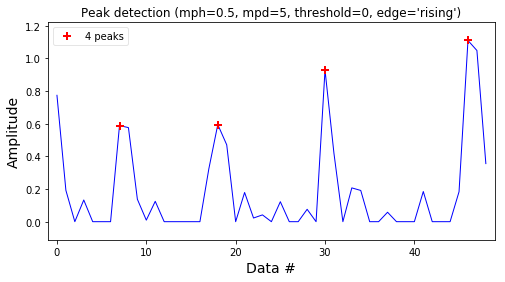

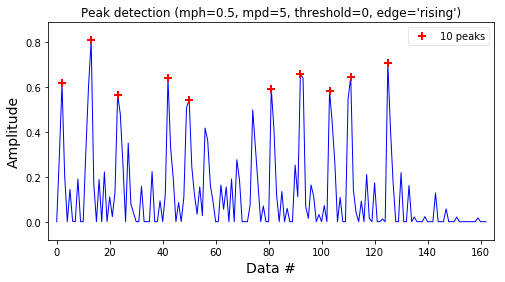

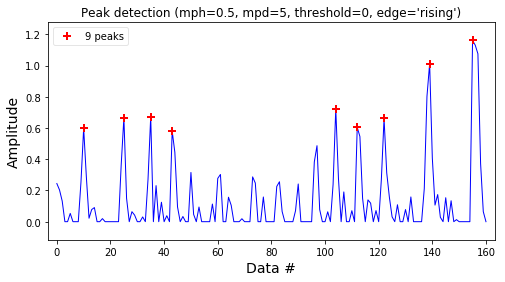

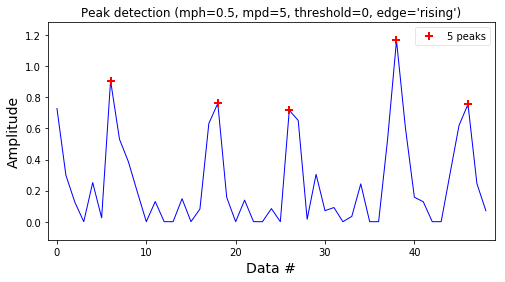

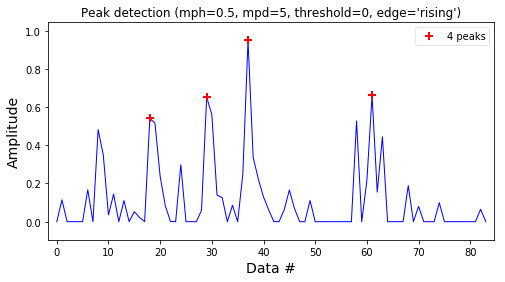

processing: E:\20190408\social8\BGS\BLOBS\social8-6_blob_analysis.csv


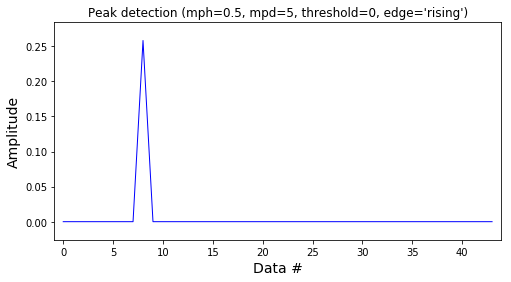

In [13]:
user_input = input("Enter the path of the directory containing the processed files in subdirectories: ")
bloblist = []
assert os.path.exists(user_input), "I did not find a directory at " + str(user_input)
if os.path.isdir(user_input):
    #print("We found your directory. The following subdirectories will be processed:")
    
    folderlist = [x[0] for x in os.walk(user_input)]
    for folder in folderlist:
        if folder.endswith('BLOBS'):
            #print(folder)
            bloblist.append(folder)
            
#######################################################
# create pandas dataframe for saving results later on #
#######################################################

IBIdf = pd.DataFrame()
boldnessdf = pd.DataFrame()
            
for path in bloblist:
    filelist = []
    # r = root, d = directory, f = file
    for r,d,f in os.walk(path):
        for file in f:
            if file.endswith('csv'):
                filelist.append(r + '\\'+ file)
    for csvfile in filelist:
        print('processing: ' + csvfile)
        data = pd.read_csv(csvfile) 
        data.columns = ['frame', 'x', 'y']
        data.replace('[]', np.nan, inplace=True)
        data.dropna(inplace=True)
        data['frame'] = data['frame'].str.strip('[]')
        data['x'] = data['x'].str.strip('[]')
        data['y'] = data['y'].str.strip('[]')
        data.drop(data[data['frame'].str.find(',') > -1].index, inplace=True)
        data = data.astype(float)
        data['distance']= np.sqrt(np.power(data['x'].shift()-data['x'],2)+
           np.power(data['y'].shift()-data['y'],2))
        data['timediff']=data['frame'].shift()-data['frame'] + 1
        data['seconds'] = data['frame']/14
        data = data.loc[data['timediff']==0]
        
        ###############################
        # identify diameter in pixels #
        ###############################
        
        maxDist = np.sqrt(np.power(data['x'].loc[data['y'].idxmax()]-data['x'].loc[data['y'].idxmin()],2) +
                                         np.power(data['y'].loc[data['y'].idxmax()]-data['y'].loc[data['y'].idxmin()],2))
        data['distance_mm'] = (data['distance']/maxDist) *60 # size of dish: 60 mm
        
        ####################################
        # identify uninterrupted trackings #
        ####################################
        
        a = 0
        data['train'] = np.nan
        for i in range(0, len(data['frame'])-2):
            if data['frame'].iloc[i]==data['frame'].iloc[i+1]-1:
                data['train'].iloc[i] = a
                data['train'].iloc[i+1] = a
            else:
                a = a+1
                
        #################################
        # analysis of interbout-interval#
        #################################
        
        IBI = [] # container for all interbout-intervals
        for train in data['train'].unique():
            if data.loc[data['train']==train].shape[0]>3*14:  # only looking into trackings longer than 3 seconds      
                indexes = detect_peaks(data['distance_mm'].loc[data['train']==train], mph=0.5, mpd=5, show=True)
                seconds = data['seconds'].loc[data['train']==train].iloc[indexes[:-1]]
                for peaktime in range(0,len(seconds)-1):
                    timediff = seconds.iloc[peaktime+1]-seconds.iloc[peaktime]
                    IBI.append(timediff)
        IBI = pd.Series(IBI)
        IBIdf[os.path.basename(csvfile)[:-18]] = IBI
        
        #############################
        # figure out boldness-score #
        #############################
        
        # find center of circle
        xvalue = (data['x'].loc[data['y'].idxmax()] + data['x'].loc[data['y'].idxmin()])/2
        yvalue = (data['y'].loc[data['y'].idxmax()] + data['y'].loc[data['y'].idxmin()])/2                                                          
        
        # The boldness-score is equivalent to the fraction of time the animal spends in the center of the dish.
        # The circle has thus to be split in two concentric circles with the same area. Thus, the radius of the 
        # inner circle has to be the radius of the outer circle divided by the square root of 2. 
        
        boldness = 0
        for index, row in data.iterrows():
            if np.sqrt(np.power(row['x']-xvalue, 2) + np.power(row['y']-yvalue,2)) < (maxDist/2)/np.sqrt(2):
                boldness += 1
        
        boldness = pd.Series(boldness / data['x'].describe()['count']) # normalize to total amount of frames
        boldnessdf[os.path.basename(csvfile)[:-18]] = boldness
        

#######################
# save results as csv #
#######################

# save all IBIs to file
file_name = user_input + '\\' + 'IBI.csv'
IBIdf.to_csv(file_name, sep='\t', encoding='utf-8')

# save only IBI mean of each video to file
socialdf = []
isolateddf = []
for i in IBIdf.columns:
    if 'isolated' in i:
        if np.isnan(IBIdf[i].mean()) == 0:
            isolateddf.append(IBIdf[i].mean())
    elif 'social' in i:
        if np.isnan(IBIdf[i].mean()) == 0:
            socialdf.append(IBIdf[i].mean())

rows = [socialdf, isolateddf]
file_name = user_input + '\\' + 'IBImeans.csv'
with open(file_name, 'a') as csvFile:
    writer = csv.writer(csvFile)
    for row in rows:
        writer.writerow(row)
csvFile.close()
            
# save boldness-scores to file
file_name = user_input + '\\' + 'boldness.csv'
boldnessdf.to_csv(file_name, sep='\t', encoding='utf-8')

# Analysis 
## light-dark-preference

In [9]:
user_input = input("Enter the path of the directory containing the processed files in subdirectories: ")
bloblist = []
assert os.path.exists(user_input), "I did not find a directory at " + str(user_input)
if os.path.isdir(user_input):
    #print("We found your directory. The following subdirectories will be processed:")
    
    folderlist = [x[0] for x in os.walk(user_input)]
    for folder in folderlist:
        if folder.endswith('BLOBS'):
            #print(folder)
            bloblist.append(folder)
            
#######################################################
# create pandas dataframe for saving results later on #
#######################################################

LDdf = pd.DataFrame()
            
for path in bloblist:
    filelist = []
    # r = root, d = directory, f = file
    for r,d,f in os.walk(path):
        for file in f:
            if file.endswith('csv'):
                filelist.append(r + '\\'+ file)
    for csvfile in filelist:
        print('processing: ' + csvfile)
        data = pd.read_csv(csvfile) 
        data.columns = ['frame', 'x', 'y']
        totalFrames = data.shape[0]
        data.replace('[]', np.nan, inplace=True)
        data.dropna(inplace=True)
        data['frame'] = data['frame'].str.strip('[]')
        data['x'] = data['x'].str.strip('[]')
        data['y'] = data['y'].str.strip('[]')
        data.drop(data[data['frame'].str.find(',') > -1].index, inplace=True)
        data = data.astype(float)
        data['distance']= np.sqrt(np.power(data['x'].shift()-data['x'],2)+
           np.power(data['y'].shift()-data['y'],2))
        data['timediff']=data['frame'].shift()-data['frame'] + 1
        data['seconds'] = data['frame']/14
        data = data.loc[data['timediff']==0]
        
              
        ########################################
        # analysis of time spent in light area #
        ########################################
        
        lightFrames = data.shape[0]
        print('light preference: ' + str(lightFrames/totalFrames))
        LDdf[os.path.basename(csvfile)[:-18]] = pd.Series(lightFrames/totalFrames)

#######################
# save results as csv #
#######################
      
# save light/dark-preference-scores to file
file_name = user_input + '\\' + 'LDpref.csv'
LDdf.to_csv(file_name, sep='\t', encoding='utf-8')

Enter the path of the directory containing the processed files in subdirectories: E:\20190408_lightdark
processing: E:\20190408_lightdark\iso1_helldunkel\BGS\BLOBS\iso1_helldunkel-1_blob_analysis.csv
light preference: 0.28369030752562713
processing: E:\20190408_lightdark\iso1_helldunkel\BGS\BLOBS\iso1_helldunkel-2_blob_analysis.csv
light preference: 0.17509792482706893
processing: E:\20190408_lightdark\iso1_helldunkel\BGS\BLOBS\iso1_helldunkel-3_blob_analysis.csv
light preference: 0.7048920743395283
processing: E:\20190408_lightdark\iso1_helldunkel\BGS\BLOBS\iso1_helldunkel-4_blob_analysis.csv
light preference: 0.18593216101341778
processing: E:\20190408_lightdark\iso1_helldunkel\BGS\BLOBS\iso1_helldunkel-5_blob_analysis.csv
light preference: 0.21510125843820319
processing: E:\20190408_lightdark\iso2_helldunkel\BGS\BLOBS\iso2_helldunkel-1_blob_analysis.csv
light preference: 0.2421035086257188
processing: E:\20190408_lightdark\iso2_helldunkel\BGS\BLOBS\iso2_helldunkel-2_blob_analysis.cs

In [6]:
data.shape[0]

(3404, 6)

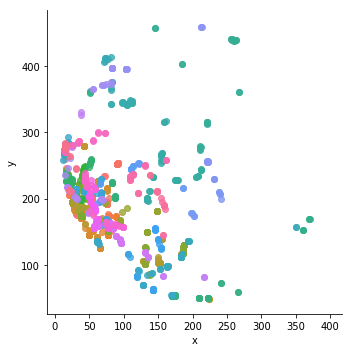

In [16]:
sns.lmplot("x", "y", hue='train', data=data, fit_reg=False, legend=False)

# testground

In [24]:

#ttest_ind(socialdf, isolateddf)        
#data['x'].describe()['count']

# find center of circle
#xvalue = (data['x'].loc[data['y'].idxmax()] + data['x'].loc[data['y'].idxmin()])/2
#yvalue = (data['y'].loc[data['y'].idxmax()] + data['y'].loc[data['y'].idxmin()])/2                                                          
        
        # The boldness-score is equivalent to the fraction of time the animal spends in the center of the dish.
        # The circle has thus to be split in two concentric circles with the same area. Thus, the radius of the 
        # inner circle has to be the radius of the outer circle divided by the square root of 2. 
        
isolated = []
social = []
        
for key in IBIdf.dtypes.index:
    if 'isolated' in key:
        for item in IBIdf[key].values:
            isolated.append(item)
    else:
        for item in IBIdf[key].values:
            social.append(item)
        
social = pd.Series(social)
isolated = pd.Series(isolated)

    #IBIdf.dtypes.index
#boldness = pd.Series(boldness / data['x'].describe()['count']) # normalize to total amount of frames
#boldnessdf[os.path.basename(csvfile)[:-18]] = boldness

#print(boldness)
IBIdf.describe()

,isolated7-1,isolated7-2,isolated7-3,isolated7-4,isolated7-5,isolated7-6,isolated8-1,isolated8-2,isolated8-3,isolated8-4,...,social7-2,social7-3,social7-4,social7-5,social7-6,social8-1,social8-2,social8-3,social8-4,social8-6
count,43.000000,22.000000,43.000000,1.000000,0.0,43.000000,2.000000,10.000000,43.000000,43.000000,...,43.000000,43.000000,2.000000,0.0,43.000000,43.000000,19.000000,43.000000,43.000000,0.0
mean,1.059801,1.012987,0.990033,1.928571,NaN,1.328904,0.785714,1.664286,0.940199,0.817276,...,1.116279,2.053156,0.892857,NaN,1.571429,1.528239,0.733083,0.953488,0.900332,NaN
std,0.565859,0.625284,0.518506,NaN,NaN,0.775935,0.101015,0.912902,0.386208,0.311468,...,0.593744,1.822085,0.151523,NaN,0.784941,0.449635,0.190241,0.366836,0.649837,NaN
min,0.428571,0.500000,0.428571,1.928571,NaN,0.500000,0.714286,0.571429,0.428571,0.428571,...,0.500000,0.500000,0.785714,NaN,0.714286,0.857143,0.571429,0.428571,0.428571,NaN
25%,0.750000,0.642857,0.571429,1.928571,NaN,0.821429,0.750000,0.875000,0.714286,0.642857,...,0.642857,1.000000,0.839286,NaN,1.000000,1.142857,0.642857,0.714286,0.571429,NaN
50%,0.857143,0.785714,0.857143,1.928571,NaN,1.214286,0.785714,1.500000,0.857143,0.785714,...,0.857143,1.785714,0.892857,NaN,1.357143,1.571429,0.642857,0.857143,0.714286,NaN
75%,1.107143,1.107143,1.178571,1.928571,NaN,1.500000,0.821429,2.303571,1.071429,0.928571,...,1.321429,2.464286,0.946429,NaN,1.821429,1.714286,0.785714,1.071429,0.892857,NaN
max,3.142857,2.857143,2.928571,1.928571,NaN,3.714286,0.857143,3.071429,2.214286,2.142857,...,2.714286,10.714286,1.000000,NaN,4.000000,3.142857,1.214286,2.357143,3.928571,NaN


0.0001417063011474037
0.17701041692429093
0.023962544465044727
2.1442448943016713e-05
0.0006063282760930123
8.161004273039447e-05
0.000582670813679242
0.059601349156634675
0.010381769466711002
0.07677269036597856
0.0014244162412528642
0.00047000770836967123
0.2478350624928346
0.0030709502034391213
0.011608483082594712
0.105116525624807
8.674429182573676e-05
0.2437122027673495
0.0021418207411497054
0.09257837036848199
0.001534400030805397
0.0009237551473781458
0.00045930696099810876
0.00030488849683463676
0.0004879930206937257
0.037487792804610766
0.03713187277958848
0.0014367499248915216
0.01655062464868627
0.028564924914883782
0.00013241119642967884
0.006806089112867647
0.0001733319947383172
0.001705453902271984
0.03519337255243629
0.007012905549135962
0.00024065319921837974
0.0018430930852376577
0.0011879495334607083
0.0009761034266153215
0.0004705126034855804
5.42427892630222e-05
0.005221754142117535
0.011815487447691918
0.0024586976514830105
0.08526183686258798
0.000118768755020233

0.00031484454610148017
0.00042992294300092285
0.2641241590484153
3.764550541908233e-05
0.0025713118825798696
0.0027311316865828755
0.008065615812628494
0.0008875508184392289
0.01914392395160666
0.00015667793944732509
0.0005045212157368567
0.03654092185796185
0.06681976601840077
0.0007586367595679667
0.00747991182886262
0.000648815617502836
0.01294594048071777
0.0012357814396189363
0.00139450402587088
0.0001302293218702159
0.00018283996675568748
0.0009776140728899871
8.56477610996174e-09
0.030672971961052002
6.535135940879602e-06
2.2472536680651553e-05
0.010217857917577738
0.0008039429458650436
0.00046371288657517354
1.4174440680193495e-07
0.0003726146344509395
3.903434988828629e-06
0.0012090557130876255
0.2807485844167801
0.0004060361501763731
0.04358345910169584
0.0031350604551491487
0.015974146115445877
0.00035908420360768656
9.199047858595402e-05
0.0027850663593206293
0.002015066349186276
0.004629349618164565
0.004457145902043852
0.005407131287768288
0.04057406693782386
0.0046668403

0.005347690912500684
0.00013149539731078708
0.012367236985104068
0.0028413455036789856
0.0003659668428530952
0.018626309015058618
0.00433280317931971
0.004008286757928749
0.011196631354528643
0.0004104364790051775
0.013208534247549997
0.13117531291958462
0.0017840405474243584
0.04522670105418895
3.304444491814495e-05
0.017155781335913983
0.06138595125679005
3.137922528925845e-05
0.0007001515491373145
0.00039372933240395023
2.6762730600536377e-06
0.029309344188287918
0.01638384202149983
0.06836105959861433
0.04712875497554151
0.01086183078858561
5.049182751847674e-06
0.04982235058073191
0.03687688949433164
0.02865699356053896
0.005167215251157517
0.0073478496862499736
0.06906691635881754
0.021791841238568626
0.005219731612447477
0.10726337220272547
0.0001143903318972689
0.00017199640743525347
0.033787174277116805
0.01301762129970071
0.013149929542218575
0.000466933716556453
0.01369481005101405
0.015646476185924962
0.018633295513696305
0.17933204725983704
0.0022384004592703828
0.02692836

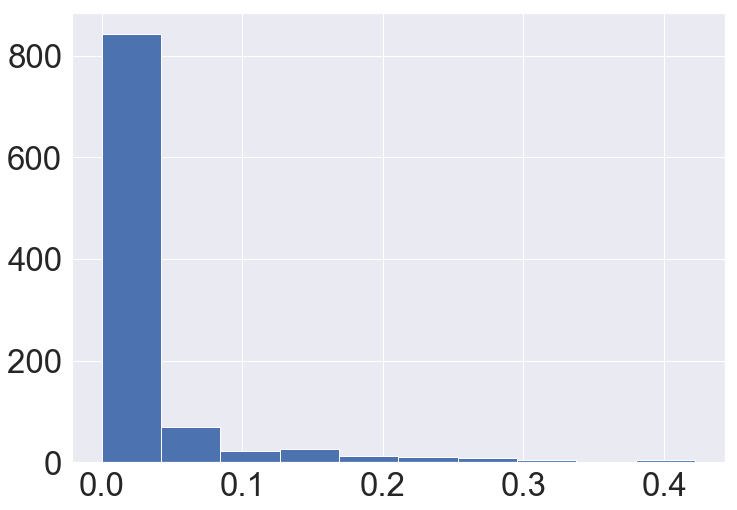

95.0 confidence interval 0.0% and 22.6%


0.025723076341566013

In [23]:
######################
# bootstrap p-values #
######################

# load dataset: here unnecessary, everything in memory already.

# configure bootstrap
n_iterations = 1000
n_size = int(100)
# run bootstrap
stats = list()
for i in range(n_iterations):
    # prepare train and test sets
    socialBT = resample(social.dropna(), n_samples=n_size)
    isoBT = resample(isolated.dropna(), n_samples=n_size)
    
    # perform test
    p = mannwhitneyu(socialBT, isoBT)[1]
    print(p)
    stats.append(p)
# plot scores
plt.hist(stats)
plt.show()
# confidence intervals
alpha = 0.95
p = ((1.0-alpha)/2.0) * 100
lower = max(0.0, np.percentile(stats, p))
p = (alpha+((1.0-alpha)/2.0)) * 100
upper = min(1.0, np.percentile(stats, p))
print('%.1f confidence interval %.1f%% and %.1f%%' % (alpha*100, lower*100, upper*100))

np.mean(stats)


,isolated,social
count,255.000000,322.000000
mean,1.047899,1.314552
std,0.588543,0.924115
min,0.428571,0.428571
25%,0.678571,0.785714
50%,0.857143,1.071429
75%,1.214286,1.642857
max,3.714286,10.714286


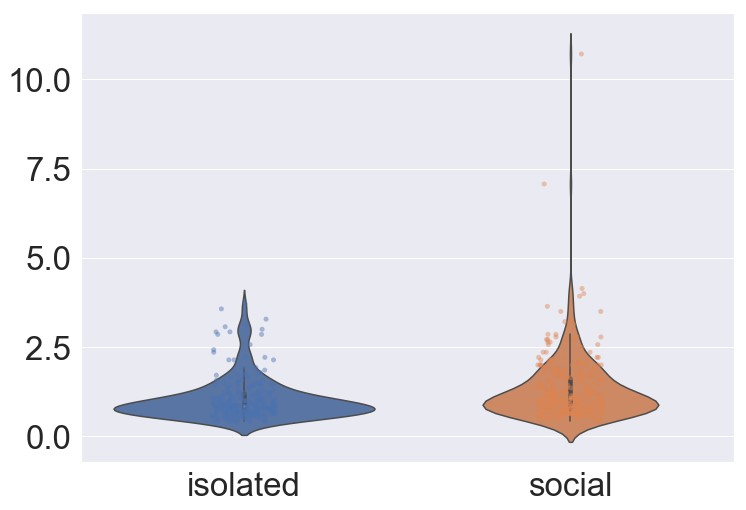

In [25]:
#isolated.dropna().describe()
#social.dropna()

IBIcomp = pd.DataFrame()
IBIcomp['isolated'] = isolated
IBIcomp['social'] = social

#IBIcomp.plot.box(figsize=(10,10))

sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set(font_scale=3)
ax = sns.violinplot(data=IBIcomp.iloc[:,0:2])
ax = sns.stripplot(data=IBIcomp.iloc[:,0:2],jitter=True, alpha=0.45)

IBIcomp.describe()



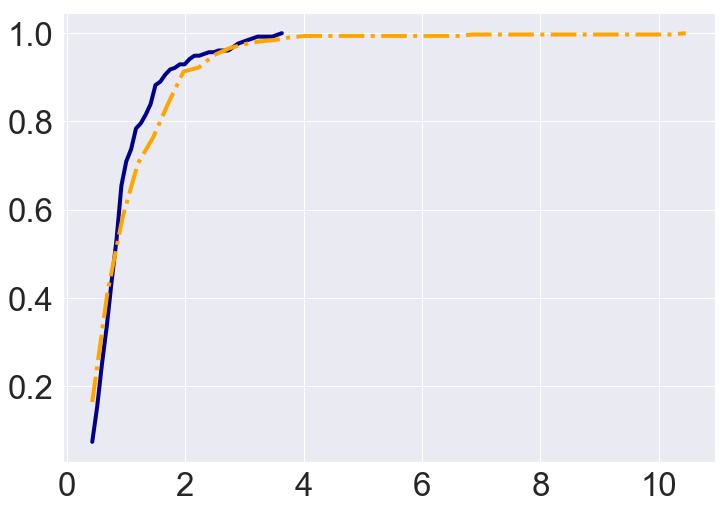

In [20]:

# evaluate the histogram
valuesIso, baseIso = np.histogram(isolated.dropna(), bins=40)
valuesSoc, baseSoc = np.histogram(social.dropna(), bins=40)
#evaluate the cumulative
cumulativeIso = np.cumsum(valuesIso)/np.max(np.cumsum(valuesIso))
cumulativeSoc = np.cumsum(valuesSoc)/np.max(np.cumsum(valuesSoc))
# plot the cumulative function
plt.plot(baseIso[:-1], cumulativeIso, c='darkblue', linewidth=4, linestyle='-')
plt.plot(baseSoc[:-1], cumulativeSoc, c='orange', linewidth=4, linestyle = '-.')
#plot the survival function
#plt.plot(base[:-1], len(data)-cumulative, c='green')

plt.show()



C:\Users\anneserl\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\lib\function_base.py:4291: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)
C:\Users\anneserl\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1872: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = np.compress(x <= hival, x)
C:\Users\anneserl\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1879: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = np.compress(x >= loval, x)
C:\Users\anneserl\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1887: RuntimeWarning: invalid value encountered in less
  np.compress(x < stats['whislo'], x),
C:\Users\anneserl\AppData\Local\Continuum\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1888: RuntimeWarning: invalid value encountered in greater
  np.compress(x > stats['whishi'], x)


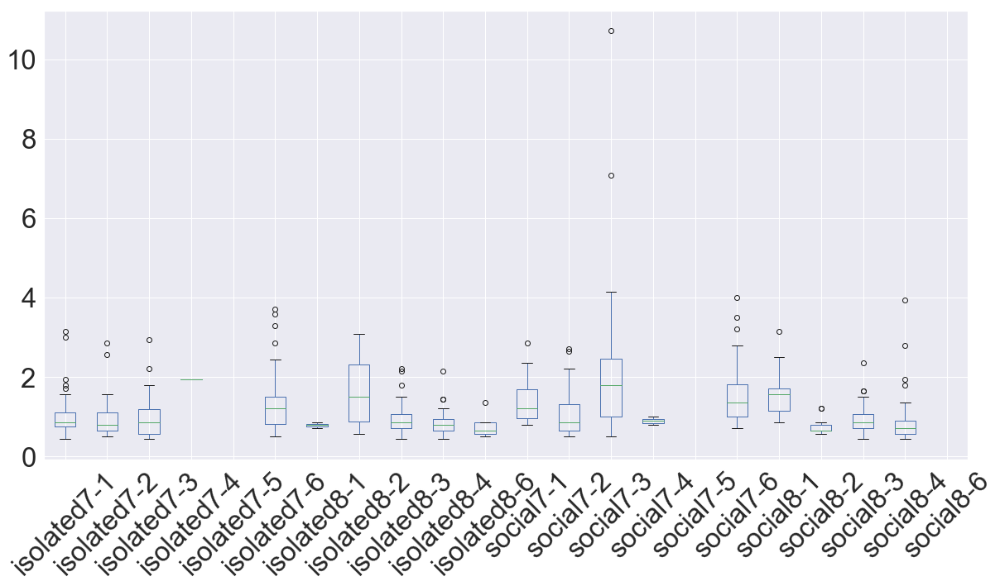

In [21]:
IBIdf.plot.box(figsize=(20,10), rot=45)

In [22]:
# IBIdf.describe()
IBIsoc = pd.DataFrame(IBIdf.iloc[:,18:].mean()).dropna()
IBIiso = pd.DataFrame(IBIdf.iloc[:,:18].mean()).dropna()

#ttest_ind(IBIsoc, IBIiso)
ttest_ind(socialdf, isolateddf)[1]

0.5917108830670381

In [11]:
# %load ./../functions/detect_peaks.py
"""Detect peaks in data based on their amplitude and other features."""

from __future__ import division, print_function
import numpy as np

__author__ = "Marcos Duarte, https://github.com/demotu/BMC"
__version__ = "1.0.5"
__license__ = "MIT"


def detect_peaks(x, mph=None, mpd=1, threshold=0, edge='rising',
                 kpsh=False, valley=False, show=False, ax=None):

    """Detect peaks in data based on their amplitude and other features.

    Parameters
    ----------
    x : 1D array_like
        data.
    mph : {None, number}, optional (default = None)
        detect peaks that are greater than minimum peak height (if parameter
        `valley` is False) or peaks that are smaller than maximum peak height
         (if parameter `valley` is True).
    mpd : positive integer, optional (default = 1)
        detect peaks that are at least separated by minimum peak distance (in
        number of data).
    threshold : positive number, optional (default = 0)
        detect peaks (valleys) that are greater (smaller) than `threshold`
        in relation to their immediate neighbors.
    edge : {None, 'rising', 'falling', 'both'}, optional (default = 'rising')
        for a flat peak, keep only the rising edge ('rising'), only the
        falling edge ('falling'), both edges ('both'), or don't detect a
        flat peak (None).
    kpsh : bool, optional (default = False)
        keep peaks with same height even if they are closer than `mpd`.
    valley : bool, optional (default = False)
        if True (1), detect valleys (local minima) instead of peaks.
    show : bool, optional (default = False)
        if True (1), plot data in matplotlib figure.
    ax : a matplotlib.axes.Axes instance, optional (default = None).

    Returns
    -------
    ind : 1D array_like
        indeces of the peaks in `x`.

    Notes
    -----
    The detection of valleys instead of peaks is performed internally by simply
    negating the data: `ind_valleys = detect_peaks(-x)`
    
    The function can handle NaN's 

    See this IPython Notebook [1]_.

    References
    ----------
    .. [1] http://nbviewer.ipython.org/github/demotu/BMC/blob/master/notebooks/DetectPeaks.ipynb

    Examples
    --------
    >>> from detect_peaks import detect_peaks
    >>> x = np.random.randn(100)
    >>> x[60:81] = np.nan
    >>> # detect all peaks and plot data
    >>> ind = detect_peaks(x, show=True)
    >>> print(ind)

    >>> x = np.sin(2*np.pi*5*np.linspace(0, 1, 200)) + np.random.randn(200)/5
    >>> # set minimum peak height = 0 and minimum peak distance = 20
    >>> detect_peaks(x, mph=0, mpd=20, show=True)

    >>> x = [0, 1, 0, 2, 0, 3, 0, 2, 0, 1, 0]
    >>> # set minimum peak distance = 2
    >>> detect_peaks(x, mpd=2, show=True)

    >>> x = np.sin(2*np.pi*5*np.linspace(0, 1, 200)) + np.random.randn(200)/5
    >>> # detection of valleys instead of peaks
    >>> detect_peaks(x, mph=-1.2, mpd=20, valley=True, show=True)

    >>> x = [0, 1, 1, 0, 1, 1, 0]
    >>> # detect both edges
    >>> detect_peaks(x, edge='both', show=True)

    >>> x = [-2, 1, -2, 2, 1, 1, 3, 0]
    >>> # set threshold = 2
    >>> detect_peaks(x, threshold = 2, show=True)

    Version history
    ---------------
    '1.0.5':
        The sign of `mph` is inverted if parameter `valley` is True
    
    """

    x = np.atleast_1d(x).astype('float64')
    if x.size < 3:
        return np.array([], dtype=int)
    if valley:
        x = -x
        if mph is not None:
            mph = -mph
    # find indices of all peaks
    dx = x[1:] - x[:-1]
    # handle NaN's
    indnan = np.where(np.isnan(x))[0]
    if indnan.size:
        x[indnan] = np.inf
        dx[np.where(np.isnan(dx))[0]] = np.inf
    ine, ire, ife = np.array([[], [], []], dtype=int)
    if not edge:
        ine = np.where((np.hstack((dx, 0)) < 0) & (np.hstack((0, dx)) > 0))[0]
    else:
        if edge.lower() in ['rising', 'both']:
            ire = np.where((np.hstack((dx, 0)) <= 0) & (np.hstack((0, dx)) > 0))[0]
        if edge.lower() in ['falling', 'both']:
            ife = np.where((np.hstack((dx, 0)) < 0) & (np.hstack((0, dx)) >= 0))[0]
    ind = np.unique(np.hstack((ine, ire, ife)))
    # handle NaN's
    if ind.size and indnan.size:
        # NaN's and values close to NaN's cannot be peaks
        ind = ind[np.in1d(ind, np.unique(np.hstack((indnan, indnan-1, indnan+1))), invert=True)]
    # first and last values of x cannot be peaks
    if ind.size and ind[0] == 0:
        ind = ind[1:]
    if ind.size and ind[-1] == x.size-1:
        ind = ind[:-1]
    # remove peaks < minimum peak height
    if ind.size and mph is not None:
        ind = ind[x[ind] >= mph]
    # remove peaks - neighbors < threshold
    if ind.size and threshold > 0:
        dx = np.min(np.vstack([x[ind]-x[ind-1], x[ind]-x[ind+1]]), axis=0)
        ind = np.delete(ind, np.where(dx < threshold)[0])
    # detect small peaks closer than minimum peak distance
    if ind.size and mpd > 1:
        ind = ind[np.argsort(x[ind])][::-1]  # sort ind by peak height
        idel = np.zeros(ind.size, dtype=bool)
        for i in range(ind.size):
            if not idel[i]:
                # keep peaks with the same height if kpsh is True
                idel = idel | (ind >= ind[i] - mpd) & (ind <= ind[i] + mpd) \
                    & (x[ind[i]] > x[ind] if kpsh else True)
                idel[i] = 0  # Keep current peak
        # remove the small peaks and sort back the indices by their occurrence
        ind = np.sort(ind[~idel])

    if show:
        if indnan.size:
            x[indnan] = np.nan
        if valley:
            x = -x
            if mph is not None:
                mph = -mph
        _plot(x, mph, mpd, threshold, edge, valley, ax, ind)

    return ind


def _plot(x, mph, mpd, threshold, edge, valley, ax, ind):
    """Plot results of the detect_peaks function, see its help."""
    try:
        import matplotlib.pyplot as plt
    except ImportError:
        print('matplotlib is not available.')
    else:
        if ax is None:
            _, ax = plt.subplots(1, 1, figsize=(8, 4))

        ax.plot(x, 'b', lw=1)
        if ind.size:
            label = 'valley' if valley else 'peak'
            label = label + 's' if ind.size > 1 else label
            ax.plot(ind, x[ind], '+', mfc=None, mec='r', mew=2, ms=8,
                    label='%d %s' % (ind.size, label))
            ax.legend(loc='best', framealpha=.5, numpoints=1)
        ax.set_xlim(-.02*x.size, x.size*1.02-1)
        ymin, ymax = x[np.isfinite(x)].min(), x[np.isfinite(x)].max()
        yrange = ymax - ymin if ymax > ymin else 1
        ax.set_ylim(ymin - 0.1*yrange, ymax + 0.1*yrange)
        ax.set_xlabel('Data #', fontsize=14)
        ax.set_ylabel('Amplitude', fontsize=14)
        mode = 'Valley detection' if valley else 'Peak detection'
        ax.set_title("%s (mph=%s, mpd=%d, threshold=%s, edge='%s')"
                     % (mode, str(mph), mpd, str(threshold), edge))
        # plt.grid()
        plt.show()

'0.8.1'